# Project 2
### Group Member
| Name          | ID         |
|---------------|------------|
| Li-Chun Huang | 406524566  |
| ZiFei Huang   | 206409322  |
| Yen-Yun Kuo   | 506395229  |

# 1. Facebook network

## Question 1

In [ ]:
import igraph as ig
import matplotlib.pyplot as plt
import numpy as np
import cairo
from PIL import Image
from IPython.display import display
import os

In [5]:
g = ig.Graph.Read_Edgelist('facebook_combined.txt', directed=False)

num_nodes = g.vcount()
num_edges = g.ecount()
print(f"Number of nodes: {num_nodes}")
print(f"Number of edges: {num_edges}")

if g.is_connected():
    print(f"The Facebook network is connected.")
else:
    gcc = g.components().giant()
    size_of_gcc = gcc.vcount()
    print(f"Size of the Giant Connected Component (GCC): {size_of_gcc}")

Number of nodes: 4039
Number of edges: 88234
The Facebook network is connected.


#### Question 1.1: Report the number of nodes and number of edges of the Facebook network.


The Facebook network has 4039 nodes and 88234 edges.

#### Question 1.2: Is the Facebook network connected? If not, find the giant connected component(GCC) of the network and report the size of the GCC.

The Facebook network is connected

## Question 2

In [ ]:
# Since we know the network is connected from Question 1, we will just measure the diameter of the network.
print(f"Diameter of the network: {g.diameter()}")

Diameter of the network: 8


#### Question 2: Find the diameter of the network. If the network is not connected, then find the diameter of the GCC

The diameter of the network is 8.

## Question 3

Average degree: 43.69101262688784


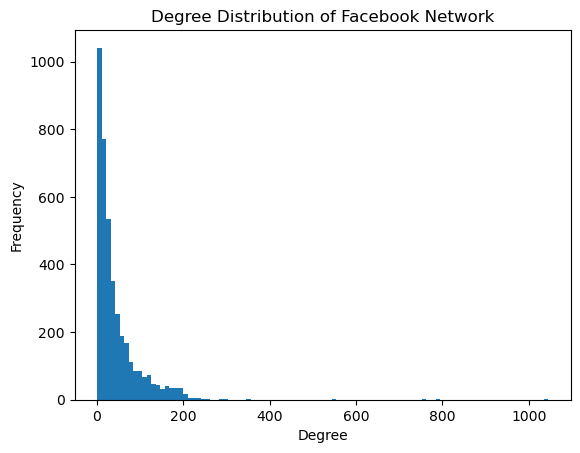

In [ ]:
degrees = g.degree()
average_degree = sum(degrees) / len(degrees)
print(f"Average degree: {average_degree}")

plt.hist(degrees, bins=100)
plt.xlabel('Degree')
plt.ylabel('Frequency')
plt.title('Degree Distribution of Facebook Network')
plt.show()

#### Question 3: Plot the degree distribution of the facebook network and report the average degree.

The degree distribution of the Facebook network is shown above. The average degree is 43.6910

## Question 4

Estimated slope: -1.180164419250883


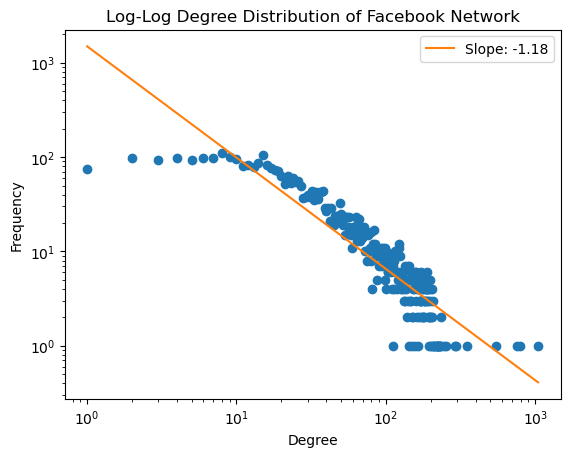

In [ ]:
degrees = g.degree()
degree_counts = np.bincount(degrees)
nonzero_degrees = np.nonzero(degree_counts)[0]
nonzero_counts = degree_counts[nonzero_degrees]

plt.figure()
plt.loglog(nonzero_degrees, nonzero_counts, 'o')
plt.xlabel('Degree')
plt.ylabel('Frequency')
plt.title('Log-Log Degree Distribution of Facebook Network')

log_degrees = np.log10(nonzero_degrees)
log_counts = np.log10(nonzero_counts)
slope, intercept = np.polyfit(log_degrees, log_counts, 1)
print(f"Estimated slope: {slope}")

plt.plot(nonzero_degrees, 10**(intercept + slope * log_degrees), label=f"Slope: {slope:.2f}")
plt.legend()
plt.show()

#### Question 4: Plot the degree distribution of Question 3 in a log-log scale. Try to fit a line to the plot and estimate the slope of the line.

The log-log scale degree distribution is shown above. The slope the the bet fit line is -1.18.

## Question 5

In [ ]:
ego = g.induced_subgraph(g.neighborhood(0))

num_nodes = ego.vcount()
num_edges = ego.ecount()
print(f"Number of nodes in personalized network: {num_nodes}")
print(f"Number of edges in personalized network: {num_edges}")

Number of nodes in personalized network: 348
Number of edges in personalized network: 2866


#### Question 5: Create a personalized network of the user whose ID is 1. How many nodes and edges does this personalized network have?

There are 348 nodes and 2866 edges in this personalized network.

## Question 6

In [ ]:
diameter = ego.diameter()
print(f"Diameter of personalized network: {diameter}")

Diameter of personalized network: 2


#### Question 6: What is the diameter of the personalized network? Please state a trivial upper and lower bound for the diameter of the personalized network

The diameter of the personalized network is 2. In a personalized network, the center user is always included and directly connected to all their friends. The trivial lower bound for the diameter is 1. This would happen if every friend is directly connected to every other friend. The trivial upper bound is 2 because even if two friends are not directly connected, they can still reach each other through the center user.

## Question 7

If the diameter of the personalized network is equal to the upper bound (2 in our case), it means that not all friends are directly connected to each other. Some friends can only reach each other by going through the central user. If the diameter is equal to the lower bound (1 in our case), it means that every friend is directly connected to every other friend, making the personalized network a complete graph that includes the center user.

## Question 8

In [ ]:
degrees = g.degree()
core_nodes = [i for i, deg in enumerate(degrees) if deg > 200]

num_core_nodes = len(core_nodes)
average_core_degree = np.mean([degrees[i] for i in core_nodes])

print(f"Number of core nodes: {num_core_nodes}")
print(f"Average degree of core nodes: {average_core_degree}")

Number of core nodes: 40
Average degree of core nodes: 279.375


#### Question 8: How many core nodes are there in the Facebook network. What is the average degree of the core nodes?

The are 40 core nodes in the Facebook network. The average degree of the core nodes is 279.375.

## Question 9

Node 1:
Fast-Greedy Modularity: 0.41310137283423476
Edge-Betweenness Modularity: 0.3533021725463346
Infomap Modularity: 0.38911847105097724


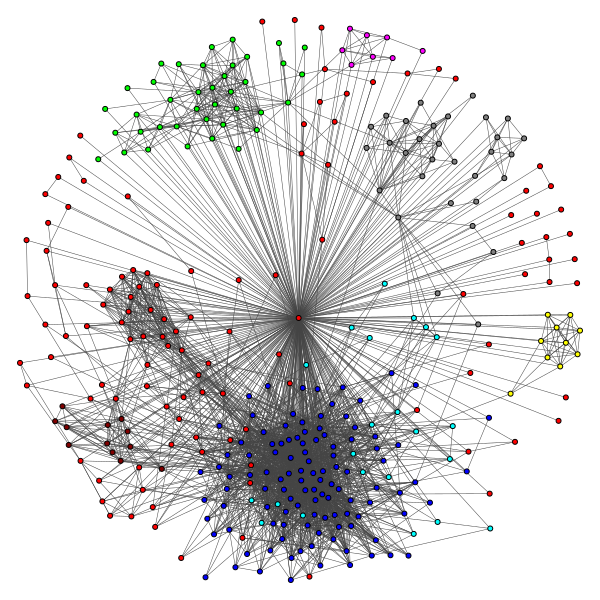

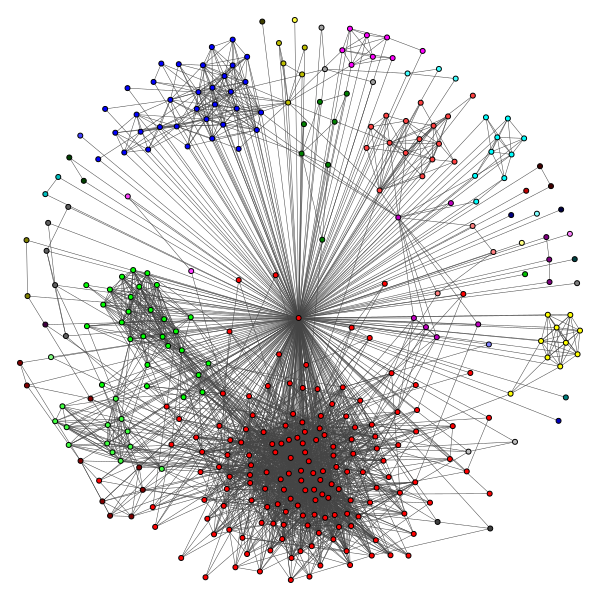

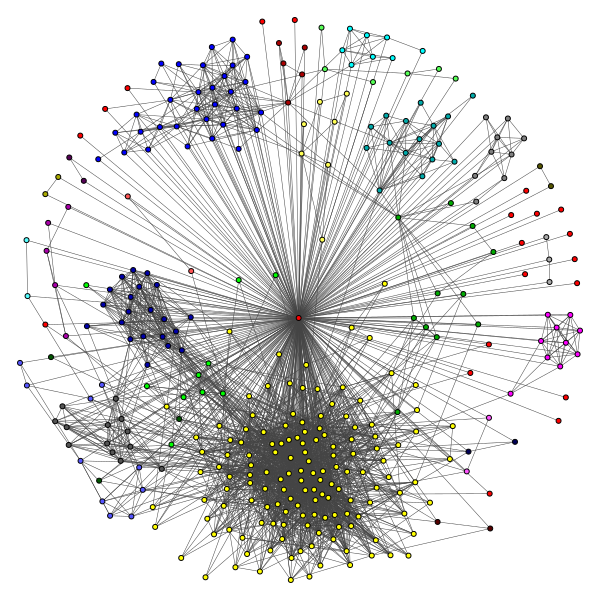

Node 108:
Fast-Greedy Modularity: 0.4359293760264749
Edge-Betweenness Modularity: 0.5067549165389017
Infomap Modularity: 0.508249171320581


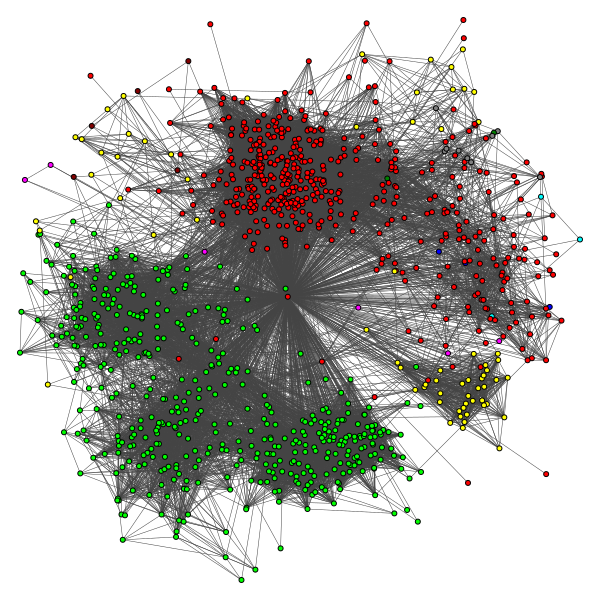

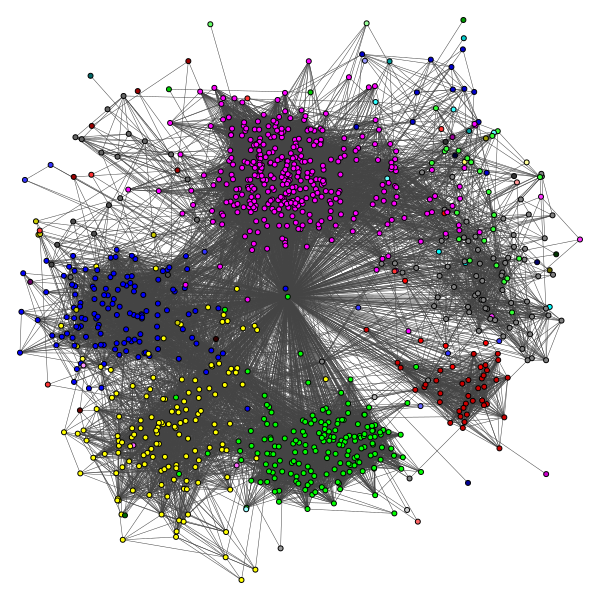

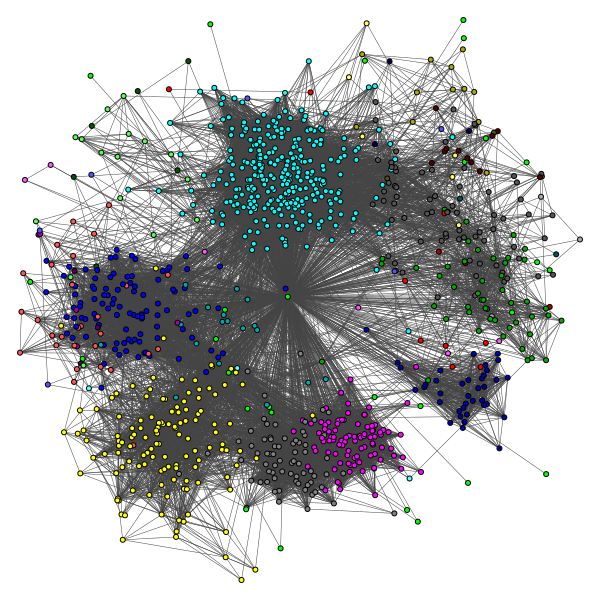

Node 349:
Fast-Greedy Modularity: 0.25171485854333114
Edge-Betweenness Modularity: 0.13352802137007774
Infomap Modularity: 0.20375299787229925


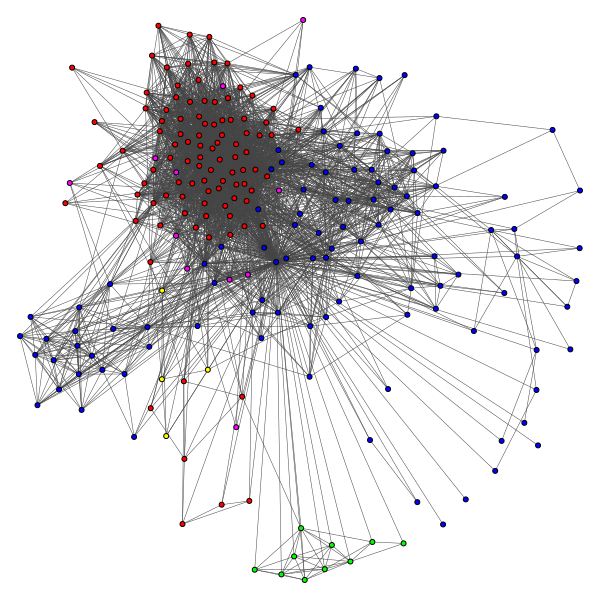

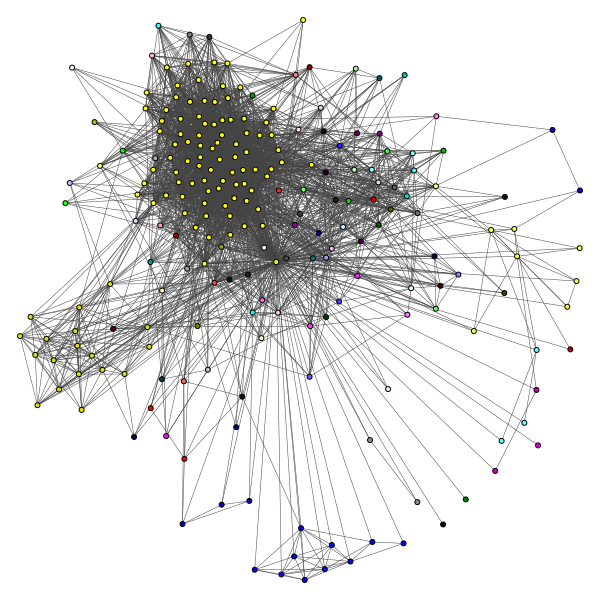

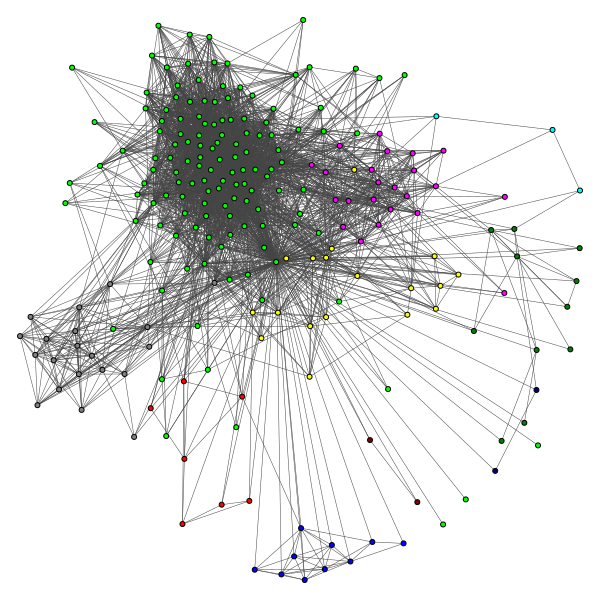

Node 484:
Fast-Greedy Modularity: 0.5070016421965142
Edge-Betweenness Modularity: 0.48909518024480314
Infomap Modularity: 0.515278752174842


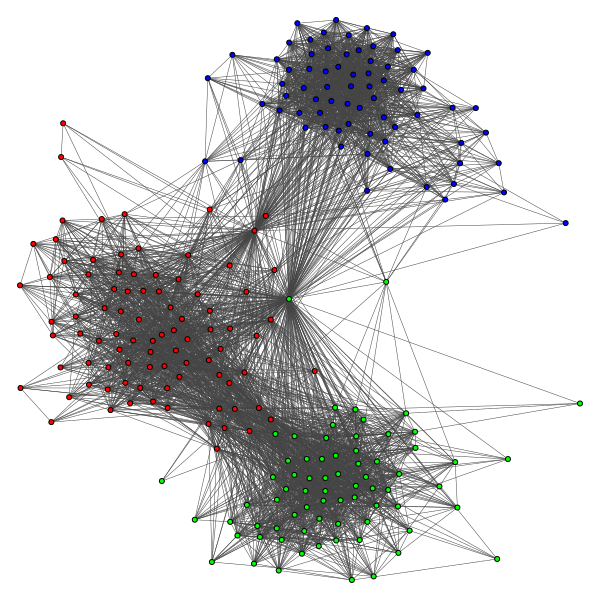

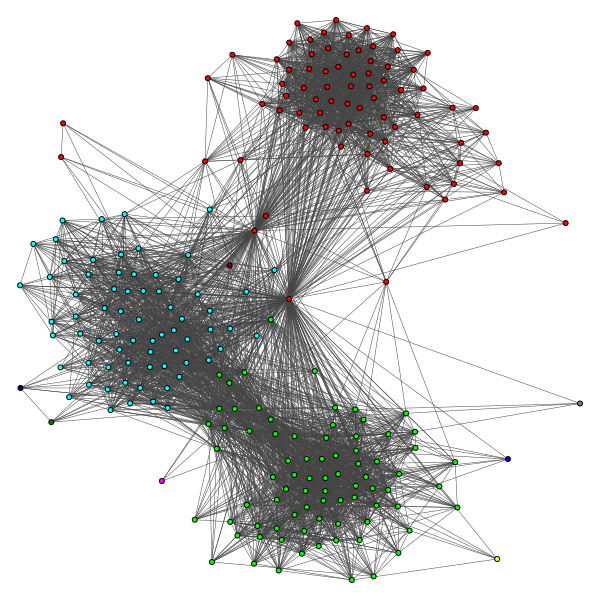

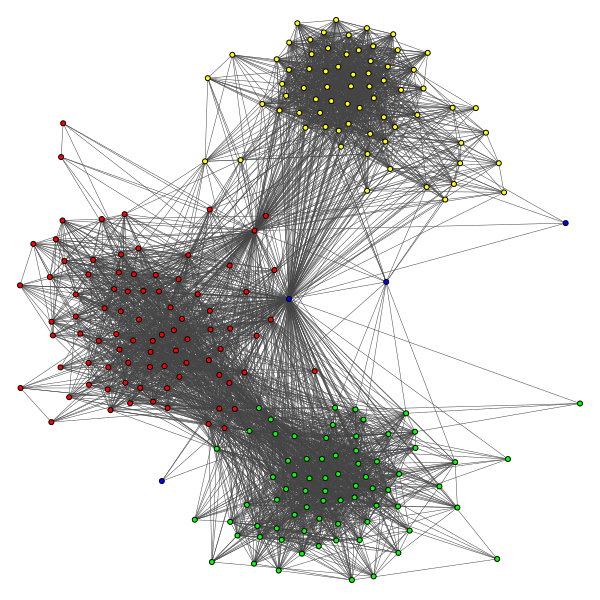

Node 1087:
Fast-Greedy Modularity: 0.14553149956549316
Edge-Betweenness Modularity: 0.027623772388463905
Infomap Modularity: 0.026906617223335438


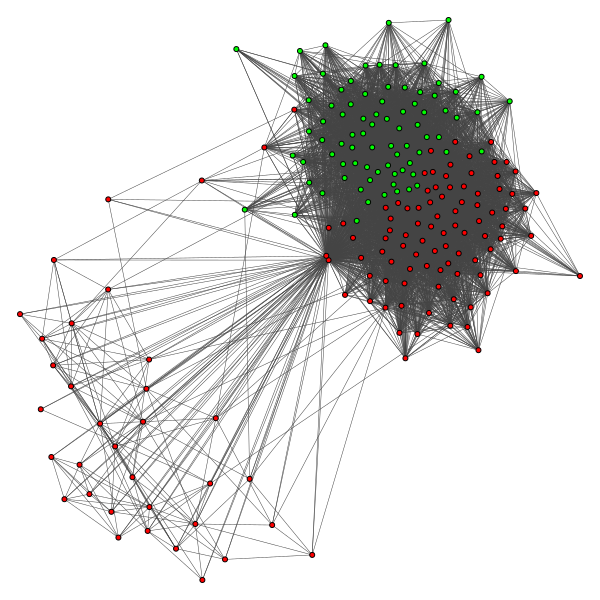

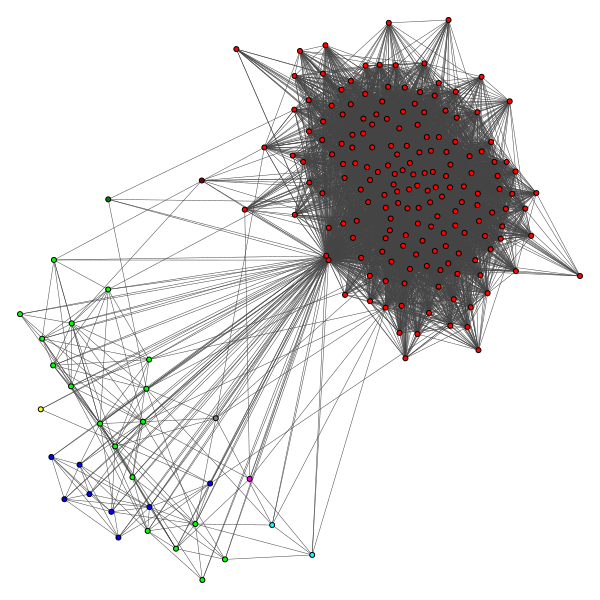

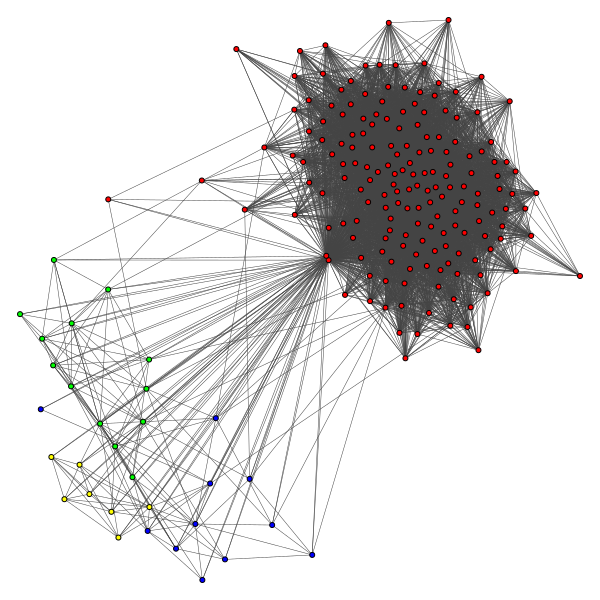

In [ ]:
target_ids = [0, 107, 348, 483, 1086]

for node_id in target_ids:
    ego = g.induced_subgraph(g.neighborhood(node_id))

    if not ego.is_connected():
        ego = ego.components().giant()

    dendrogram_fg = ego.community_fastgreedy()
    communities_fg = dendrogram_fg.as_clustering()
    modularity_fg = communities_fg.modularity

    dendrogram_eb = ego.community_edge_betweenness()
    communities_eb = dendrogram_eb.as_clustering()
    modularity_eb = communities_eb.modularity

    communities_im = ego.community_infomap()
    modularity_im = communities_im.modularity

    print(f"Node {node_id+1}:")
    print(f"Fast-Greedy Modularity: {modularity_fg}")
    print(f"Edge-Betweenness Modularity: {modularity_eb}")
    print(f"Infomap Modularity: {modularity_im}")

    layout = ego.layout('fr')

    visual_style = {
        "layout": layout,
        "bbox": (600, 600),
        "margin": 20,
        "vertex_size": 5,
        "edge_width": 0.5
    }

    ego.vs['color'] = ig.drawing.colors.ClusterColoringPalette(len(communities_fg)).get_many(communities_fg.membership)
    plot_path = f"Node{node_id+1}_FastGreedy.png"
    ig.plot(ego, target=plot_path, **visual_style)
    display(Image.open(plot_path))
    os.remove(plot_path)

    ego.vs['color'] = ig.drawing.colors.ClusterColoringPalette(len(communities_eb)).get_many(communities_eb.membership)
    plot_path = f"Node{node_id+1}_EdgeBetweenness.png"
    ig.plot(ego, target=plot_path, **visual_style)
    display(Image.open(plot_path))
    os.remove(plot_path)

    ego.vs['color'] = ig.drawing.colors.ClusterColoringPalette(len(communities_im)).get_many(communities_im.membership)
    plot_path = f"Node{node_id+1}_Infomap.png"
    ig.plot(ego, target=plot_path, **visual_style)
    display(Image.open(plot_path))
    os.remove(plot_path)


#### Question 9: For each of the above core node’s personalized network, find the community struc- ture using Fast-Greedy, Edge-Betweenness, and Infomap community detection algorithms. Compare the modularity scores of the algorithms. For visualization purpose, display the community structure of the core node’s personalized networks using colors. Nodes belonging to the same community should have the same color and nodes belonging to different communities should have different color. In this question, you should have 15 plots in total.

Overall, the modularity scores show that Node 484 and Node 108 had the strongest community structures, with Infomap reaching over 0.51 and Fast-Greedy also performing well above 0.5. Node 349 and Node 1087 had much lower modularity scores across all algorithms. This indicates weak or unclear communities. Across most nodes, Infomap tended to achieve slightly higher modularity than Fast-Greedy, while Edge-Betweenness often had the lowest modularity values. These patterns suggest that for core nodes with denser and more structured connections, Infomap and Fast-Greedy are more effective at detecting strong communities.

## Question 10

Node 1 Modified Personalized Network Modularity (after removing core):
Fast-Greedy: 0.4429481300896365
Edge-Betweenness: 0.4139775886697185
Infomap: 0.415864713689259


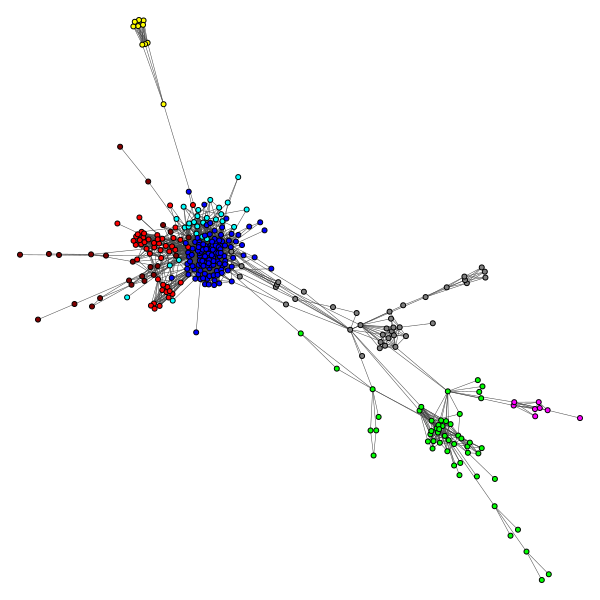

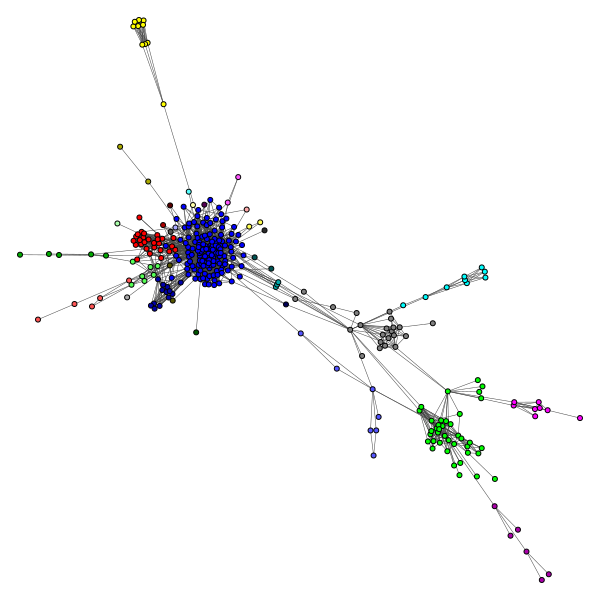

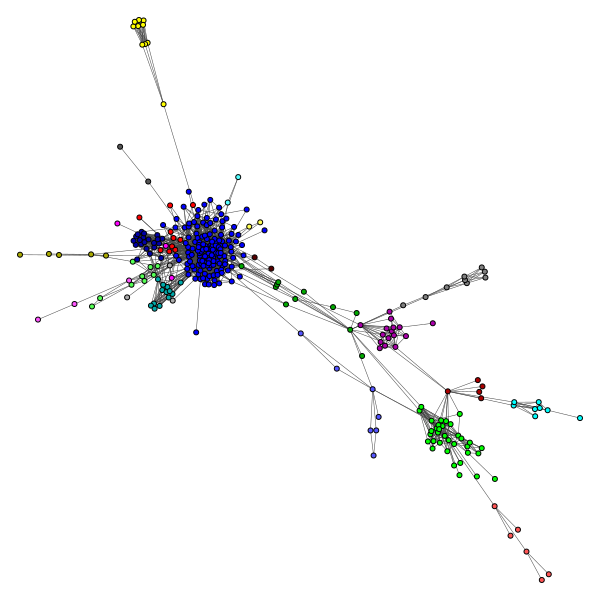

Node 108 Modified Personalized Network Modularity (after removing core):
Fast-Greedy: 0.45812709371997556
Edge-Betweenness: 0.5213215763822159
Infomap: 0.5205171225434534


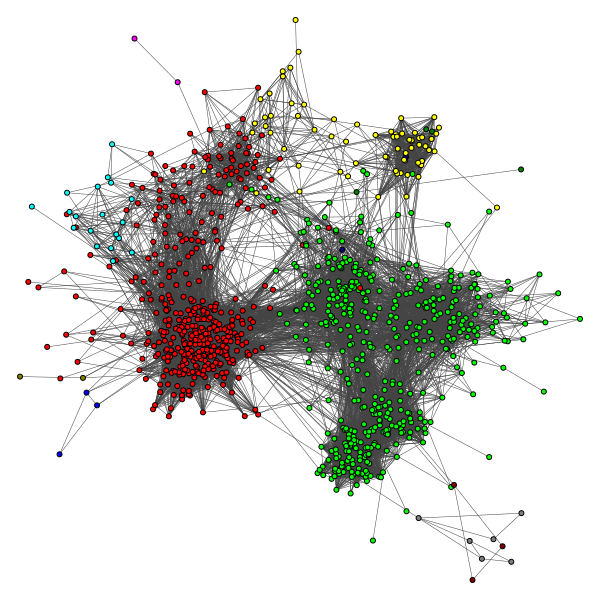

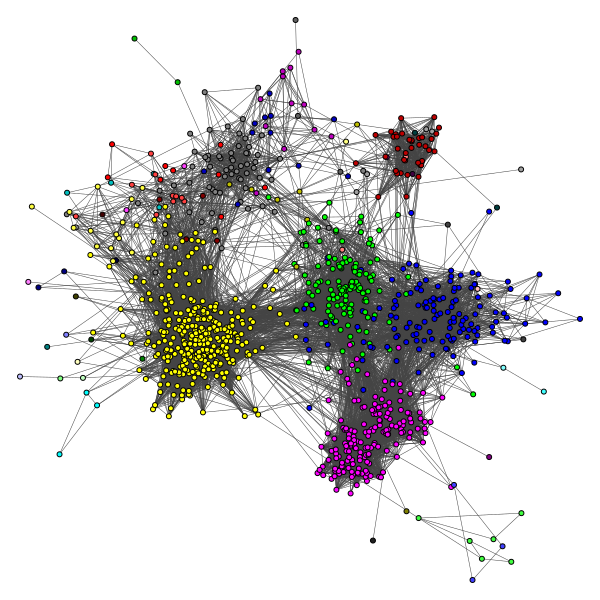

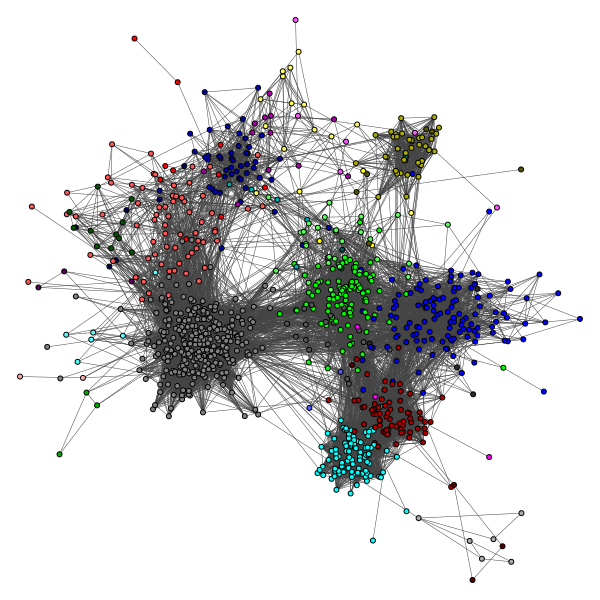

Node 349 Modified Personalized Network Modularity (after removing core):
Fast-Greedy: 0.24569179594267446
Edge-Betweenness: 0.15056634018755943
Infomap: 0.24657849262339698


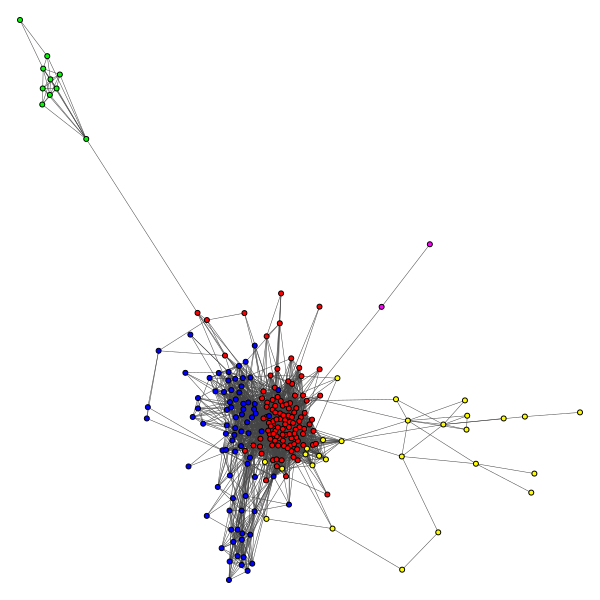

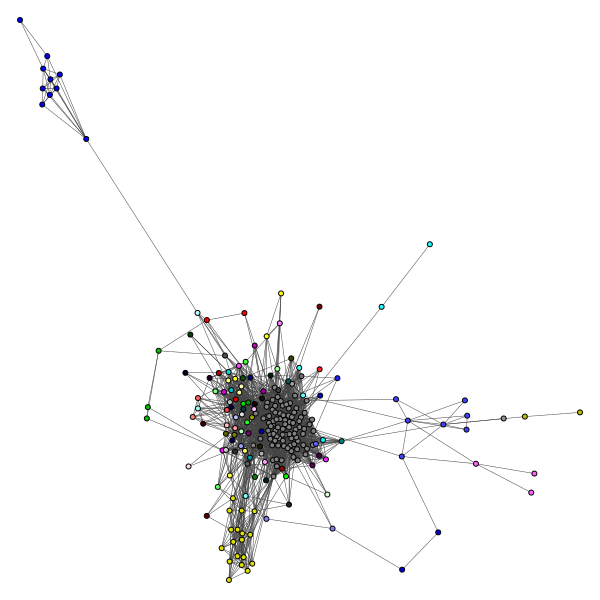

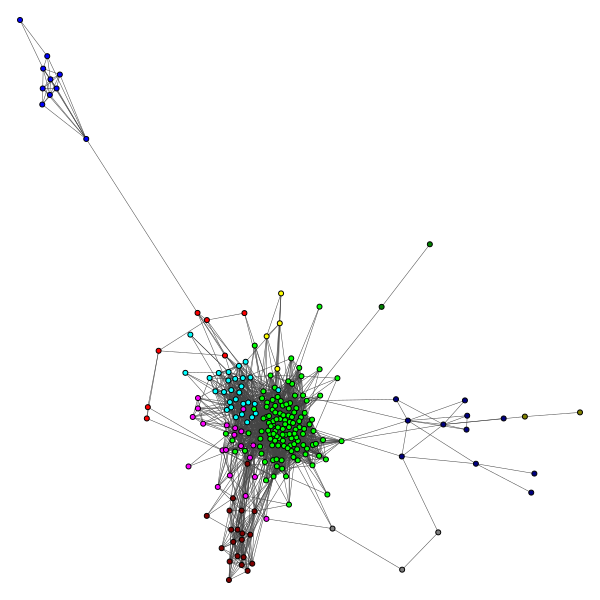

Node 484 Modified Personalized Network Modularity (after removing core):
Fast-Greedy: 0.5342141546061717
Edge-Betweenness: 0.5154412771235044
Infomap: 0.5434436792795224


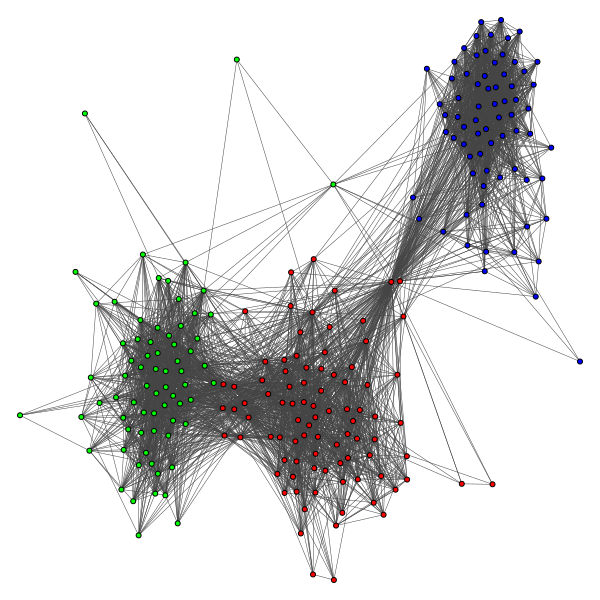

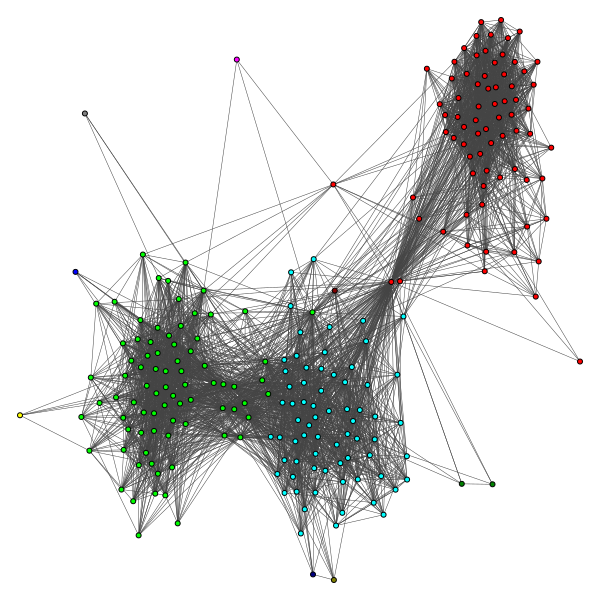

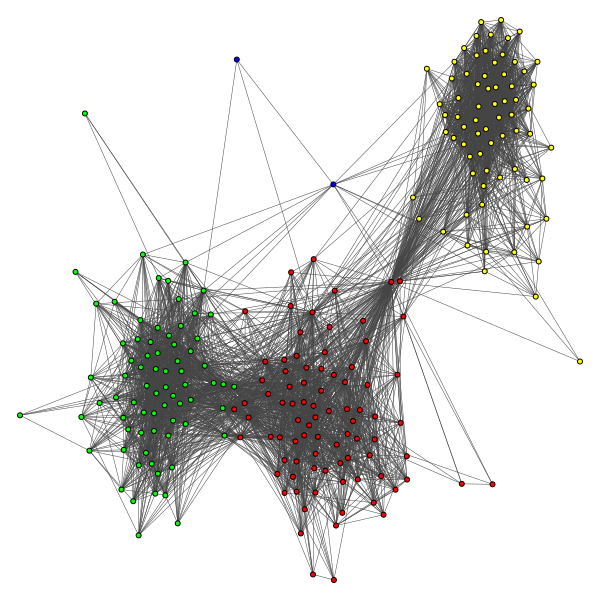

Node 1087 Modified Personalized Network Modularity (after removing core):
Fast-Greedy: 0.14819563195349847
Edge-Betweenness: 0.03249529804991403
Infomap: 0.027371594487114542


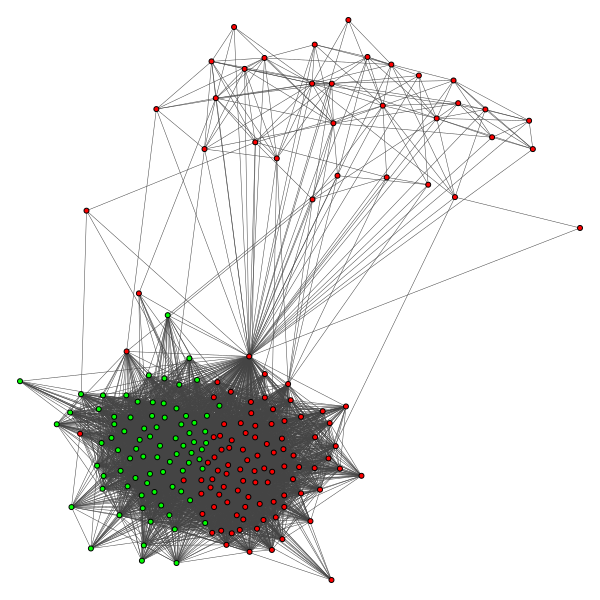

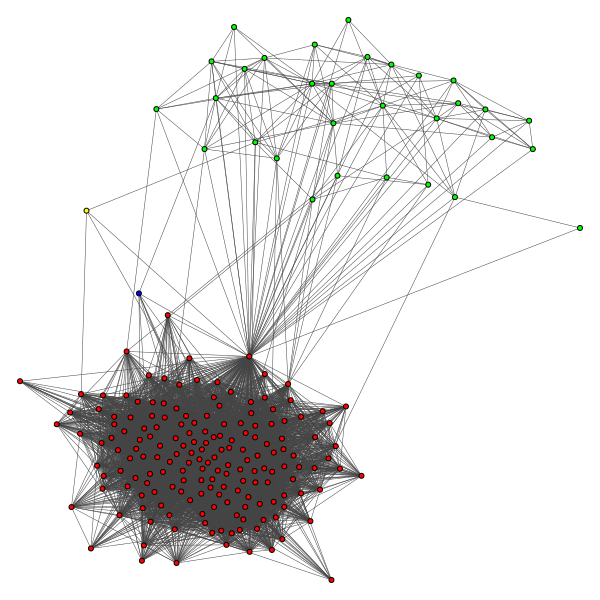

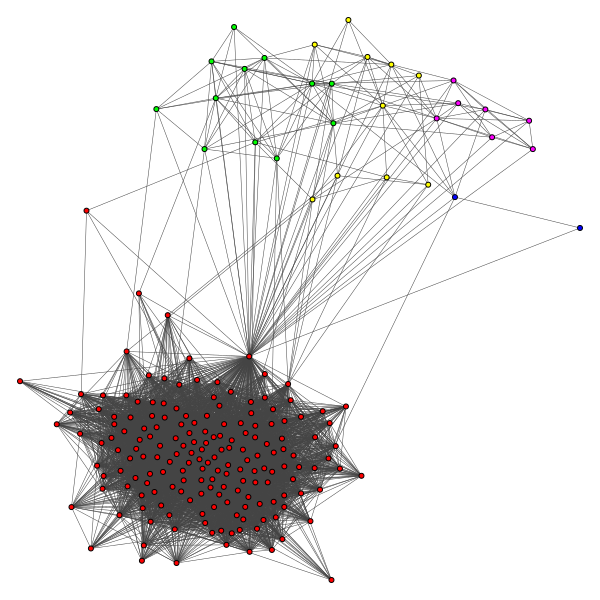

In [ ]:
for node_id in target_ids:
    neighbors = g.neighbors(node_id, mode='ALL')
    network = g.subgraph(neighbors)

    if not network.is_connected():
        network = network.components().giant()

    layout = network.layout('fr')

    dendrogram_fg_mod = network.community_fastgreedy()
    communities_fg_mod = dendrogram_fg_mod.as_clustering()
    modularity_fg_modified = communities_fg_mod.modularity

    dendrogram_eb_mod = network.community_edge_betweenness()
    communities_eb_mod = dendrogram_eb_mod.as_clustering()
    modularity_eb_modified = communities_eb_mod.modularity

    communities_im_mod = network.community_infomap()
    modularity_im_modified = communities_im_mod.modularity

    print(f"Node {node_id+1} Modified Personalized Network Modularity (after removing core):")
    print(f"Fast-Greedy: {modularity_fg_modified}")
    print(f"Edge-Betweenness: {modularity_eb_modified}")
    print(f"Infomap: {modularity_im_modified}")

    visual_style = {
        "layout": layout,
        "bbox": (600, 600),
        "margin": 20,
        "vertex_size": 5,
        "edge_width": 0.5
    }

    network.vs['color'] = ig.drawing.colors.ClusterColoringPalette(len(communities_fg_mod)).get_many(communities_fg_mod.membership)
    plot_path = f"Node{node_id+1}_FastGreedy_Modified.png"
    ig.plot(network, target=plot_path, **visual_style)
    display(Image.open(plot_path))
    os.remove(plot_path)

    network.vs['color'] = ig.drawing.colors.ClusterColoringPalette(len(communities_eb_mod)).get_many(communities_eb_mod.membership)
    plot_path = f"Node{node_id+1}_EdgeBetweenness_Modified.png"
    ig.plot(network, target=plot_path, **visual_style)
    display(Image.open(plot_path))
    os.remove(plot_path)

    network.vs['color'] = ig.drawing.colors.ClusterColoringPalette(len(communities_im_mod)).get_many(communities_im_mod.membership)
    plot_path = f"Node{node_id+1}_Infomap_Modified.png"
    ig.plot(network, target=plot_path, **visual_style)
    display(Image.open(plot_path))
    os.remove(plot_path)


#### Question 10: For each of the core node’s personalized network (use same core nodes as Question 9), remove the core node from the personalized network and find the community structure of the modified personalized network. Use the same community detection algorithm as Question 9. Compare the modularity score of the community structure of the modified personalized network with the modularity score of the community structure of the personalized network of Question 9. For visualization purpose, display the community structure of the modified personalized network using colors. In this question, you should have 15 plots in total.

After removing the core nodes, the modularity scores generally increased slightly across most networks. For Node 1, the modularity improved from 0.4131 to 0.4429 with Fast-Greedy, and from 0.3533 to 0.4140 with Edge-Betweenness. This indicates a clearer community structure without the central node. For Node 108 and Node 484, modularity scores increased across all three algorithms. This suggests even stronger and more separated communities after core node removal. There is very little change for Node 349. For Node 1087, modularity scores stayed low overall with a slight increase. This indicates weak but slightly improved community separation. Overall, removing the core nodes made the community structures slightly more distinct in most cases.


## Question 11

#### Question 11:Write an expression relating the Embeddedness between the core node and a non-core node to the degree of the non-core node in the personalized network of the core node.

Embeddedness(u, core) = number of mutual friends between node `u` and `core`.
Degree(u) = number of friends node `u` has in the network.

Let:

- u : non-core node
- core : core node
- Degree(u) = ∣N(u)∣ : neighbors of node `u`
- Degree(core) = ∣N(u=core)∣ : neighbors of the `core` node

Then

> Embeddedness(u,core) = ∣N(u)∩N(core)∣

Since degree is defined as the number of friends of a node, the upper bound of embeddedness can be expressed by using degrees:

> Embeddedness(u,core) ≤ min(Degree(u),Degree(core))




## Question 12

<ipython-input-4-a2732af6943c>:30: DeprecationWarning: Graph.shortest_paths() is deprecated; use Graph.distances() instead
  d = temp.shortest_paths(mutual_list[i], mutual_list[j])[0][0]


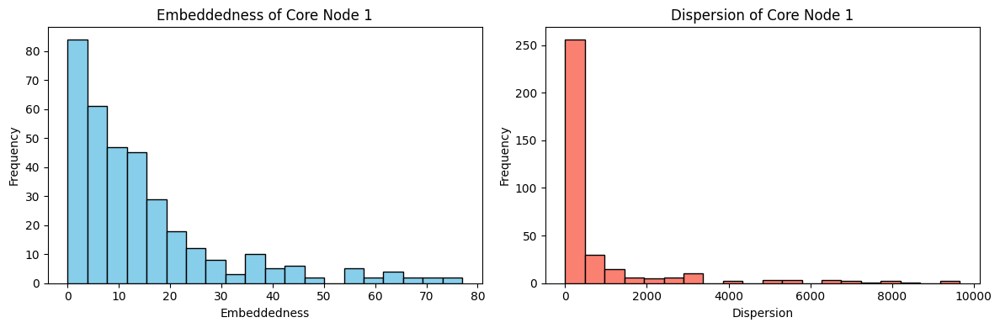

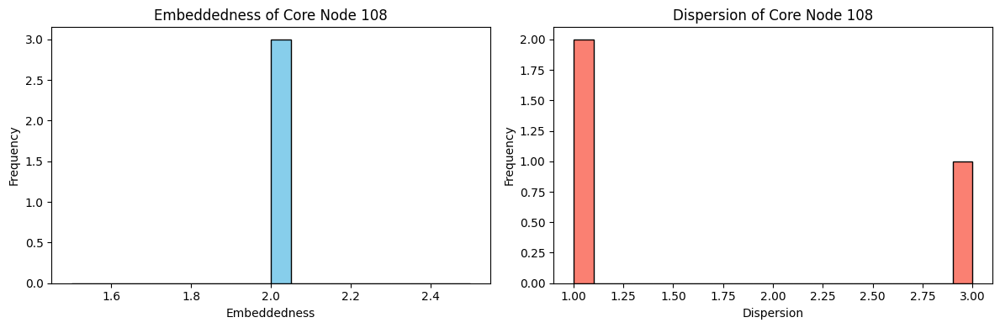

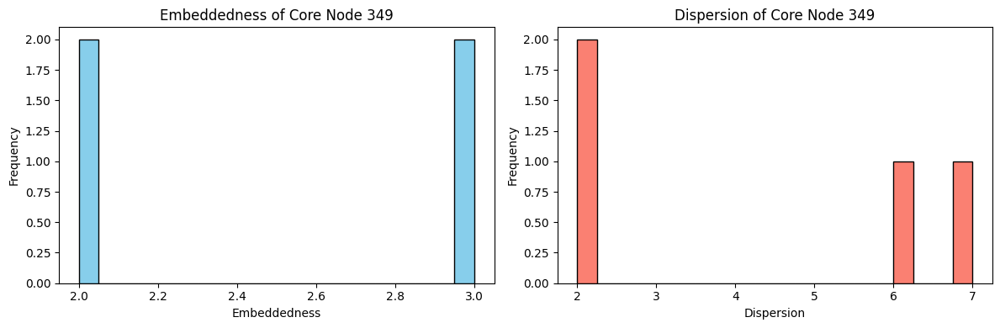

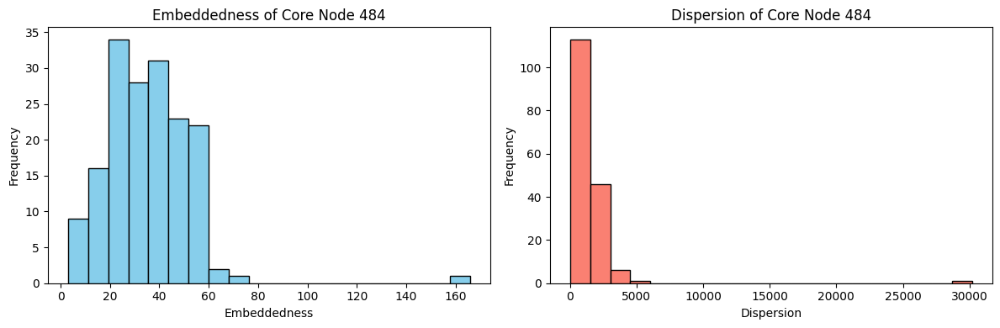

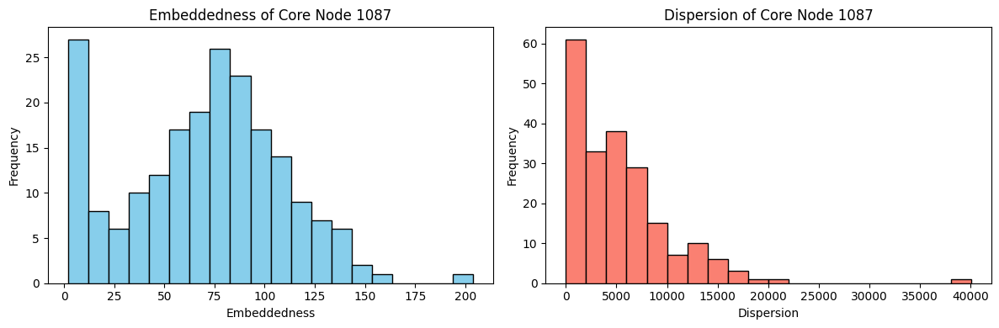

In [ ]:
target_ids = [0, 107, 348, 483, 1086]

for node_id in target_ids:
    ego = g.induced_subgraph(g.neighborhood(node_id))
    new_core_id = g.neighborhood(node_id).index(node_id)
    neighbors = set(ego.neighbors(new_core_id))

    embeddedness = []
    dispersion = []

    for u in neighbors:
        # mutual friends
        mutual = set(ego.neighbors(new_core_id)) & set(ego.neighbors(u))
        embeddedness.append(len(mutual))

        if len(mutual) < 2:
            dispersion.append(0)
            continue

        # create new subgraph and remove core node and node u
        temp = ego.copy()
        temp.delete_vertices([new_core_id, u])

        # Calculate the shortest path for every pair of the mutual friends
        mutual_list = list(mutual)
        dist_sum = 0
        for i in range(len(mutual_list)):
            for j in range(i+1, len(mutual_list)):
                try:
                    d = temp.shortest_paths(mutual_list[i], mutual_list[j])[0][0]
                    if d != float("inf"):
                        dist_sum += d
                except:
                    continue
        dispersion.append(dist_sum)


    fig, axs = plt.subplots(1, 2, figsize=(12, 4))

    axs[0].hist(embeddedness, bins=20, color='skyblue', edgecolor='black')
    axs[0].set_title(f"Embeddedness of Core Node {node_id+1}")
    axs[0].set_xlabel("Embeddedness")
    axs[0].set_ylabel("Frequency")

    axs[1].hist(dispersion, bins=20, color='salmon', edgecolor='black')
    axs[1].set_title(f"Dispersion of Core Node {node_id+1}")
    axs[1].set_xlabel("Dispersion")
    axs[1].set_ylabel("Frequency")

    plt.tight_layout()
    plt.show()


#### Question 12: For each of the core node’s personalized network (use the same core nodes as Question 9), plot the distribution histogram of embeddedness and dispersion. In this question, you will have 10 plots.

We analyzed the personalized network of five core nodes and computed the embeddedness and dispersion.
Embeddedness measures the number of mutual friends between a neighbor and the core node. Dispersion shows how disconnected those mutual friends are from each other.

The histograms show that most neighbors tend to have low to moderate embeddedness, and only a few of them have high values. This means that some friends are very close to the core node, but many others are not as closely connected.

On the other hand, the value of dispersion varies more widely. The nodes with low embeddedness but relatively high dispersion suggest that they may serve as bridges to other parts of the network.

## Question 13

<ipython-input-5-349cd6bd0497>:30: DeprecationWarning: Graph.shortest_paths() is deprecated; use Graph.distances() instead
  d = temp.shortest_paths(mutual_list[i], mutual_list[j])[0][0]


Node 1: Max embeddedness node = 56, Max dispersion node = 67


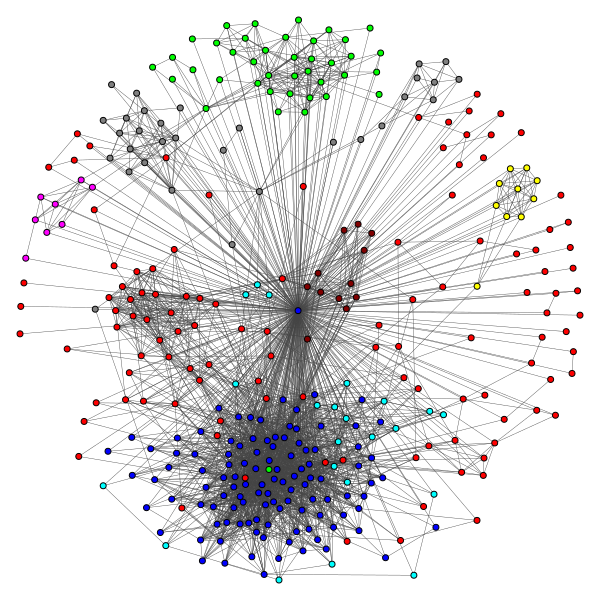

Node 108: Max embeddedness node = 0, Max dispersion node = 58


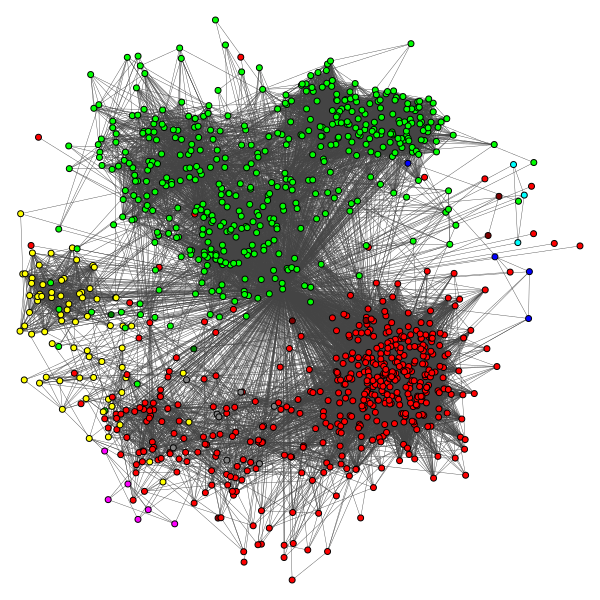

Node 349: Max embeddedness node = 198, Max dispersion node = 198


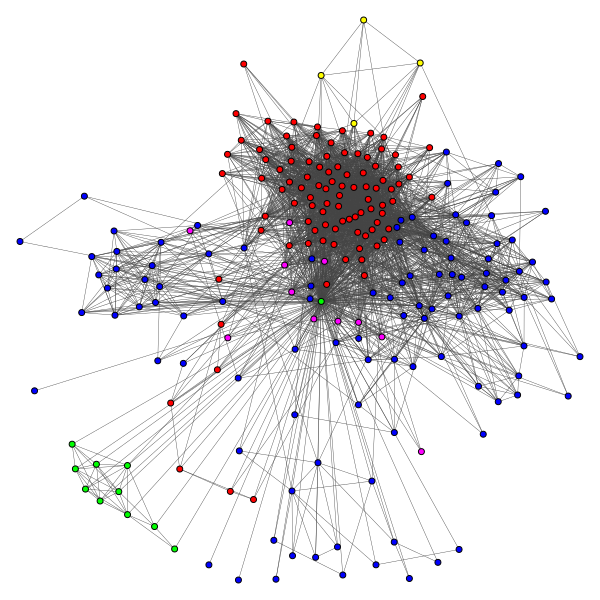

Node 484: Max embeddedness node = 482, Max dispersion node = 482


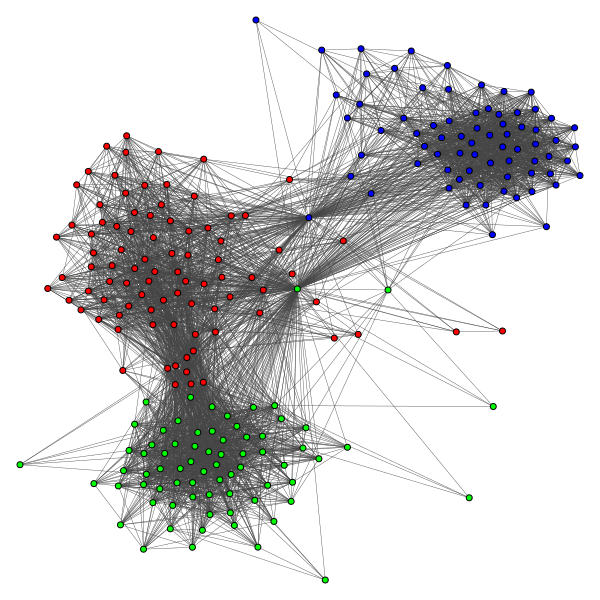

Node 1087: Max embeddedness node = 1083, Max dispersion node = 1083


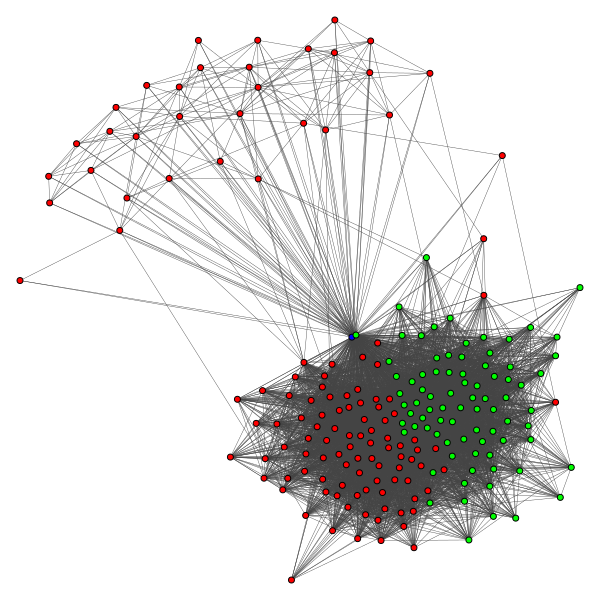

In [ ]:
target_ids = [0, 107, 348, 483, 1086]

for node_id in target_ids:
    ego = g.induced_subgraph(g.neighborhood(node_id))
    new_core_id = g.neighborhood(node_id).index(node_id)
    neighbors = set(ego.neighbors(new_core_id))

    embeddedness = []
    dispersion = []

    for u in neighbors:
        # mutual friends
        mutual = set(ego.neighbors(new_core_id)) & set(ego.neighbors(u))
        embeddedness.append(len(mutual))

        if len(mutual) < 2:
            dispersion.append(0)
            continue

        # create new subgraph and remove core node and node u
        temp = ego.copy()
        temp.delete_vertices([new_core_id, u])

        # Calculate the shortest path for every pair of the mutual friends
        mutual_list = list(mutual)
        dist_sum = 0
        for i in range(len(mutual_list)):
            for j in range(i+1, len(mutual_list)):
                try:
                    d = temp.shortest_paths(mutual_list[i], mutual_list[j])[0][0]
                    if d != float("inf"):
                        dist_sum += d
                except:
                    continue
        dispersion.append(dist_sum)


    # find the max embeddedness and maximum dispersion node
    neighbors_list = list(neighbors)
    max_embeddedness_node = neighbors_list[np.argmax(embeddedness)]
    max_dispersion_node = neighbors_list[np.argmax(dispersion)]

    # Fast-Greedy
    communities_fg = ego.community_fastgreedy().as_clustering()
    palette = ig.drawing.colors.ClusterColoringPalette(len(communities_fg))
    colors = palette.get_many(communities_fg.membership)


    colors[new_core_id] = "blue"
    colors[max_embeddedness_node] = "red"
    colors[max_dispersion_node] = "green"
    ego.vs["color"] = colors

    # 畫圖
    layout = ego.layout("fr")
    visual_style = {
        "layout": layout,
        "bbox": (600, 600),
        "margin": 20,
        "vertex_size": 6,
        "edge_width": 0.4
    }

    print(f"Node {node_id+1}: Max embeddedness node = {g.neighborhood(node_id)[max_embeddedness_node]}, Max dispersion node = {g.neighborhood(node_id)[max_dispersion_node]}")
    plot_path = f"Node{node_id+1}_Q13_MaxNodes.png"
    ig.plot(ego, target=plot_path, **visual_style)
    display(Image.open(plot_path))
    os.remove(plot_path)




#### Question 13: For each of the core node’s personalized network, plot the community structure of the personalized network using colors and highlight the node with maximum dispersion. Also, highlight the edges incident to this node. To detect the community structure, use Fast-Greedy algorithm. In this question, you will have 5 plots.


*   Red dot: The node with the highest embeddedness

*   Green dot: The node with the highest dispersion


The plots show that nodes with high embeddedness are usually near the core node and are part of the same group, meaning they are closely connected.


In contrast, the high dispersion nodes tend to appear further from the core, often linking to multiple different regions of the network. This supports the idea that dispersion helps find nodes that are not very close to the core but connect different parts of the network.

## Question 14

<ipython-input-12-646c8516f86b>:38: DeprecationWarning: Graph.shortest_paths() is deprecated; use Graph.distances() instead
  d = temp.shortest_paths(mutual_list[i], mutual_list[j])[0][0]


Node 1 Result：
Max Embeddedness Node ID: 56
Max Dispersion Node ID: 67


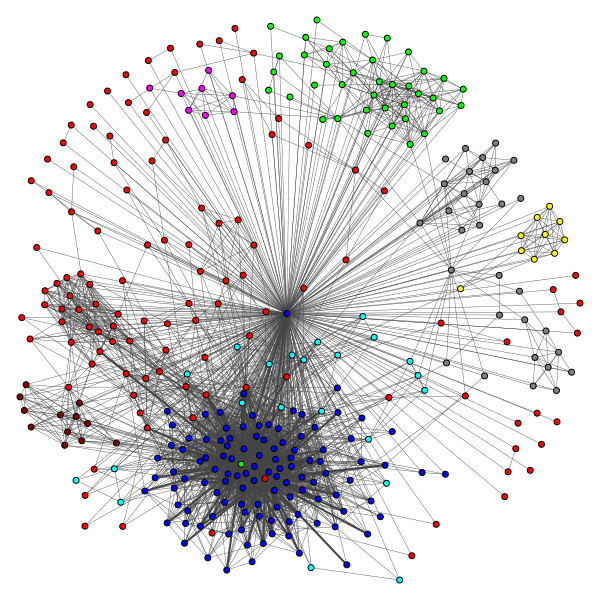

Node 108 Result：
Max Embeddedness Node ID: 0
Max Dispersion Node ID: 58


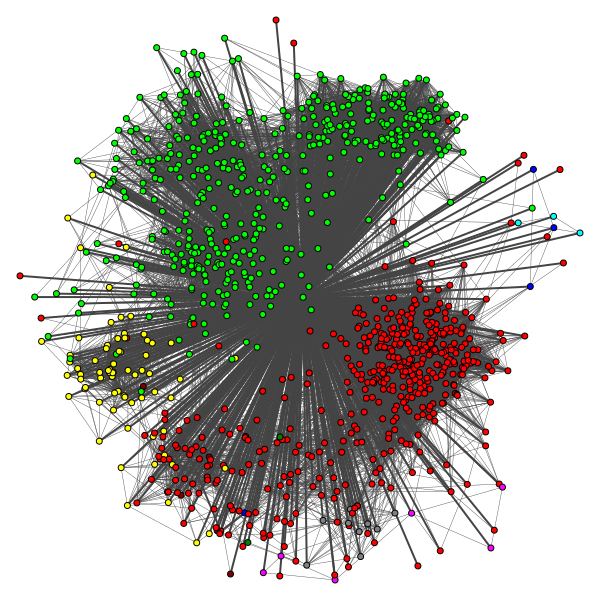

Node 349 Result：
Max Embeddedness Node ID: 198
Max Dispersion Node ID: 198


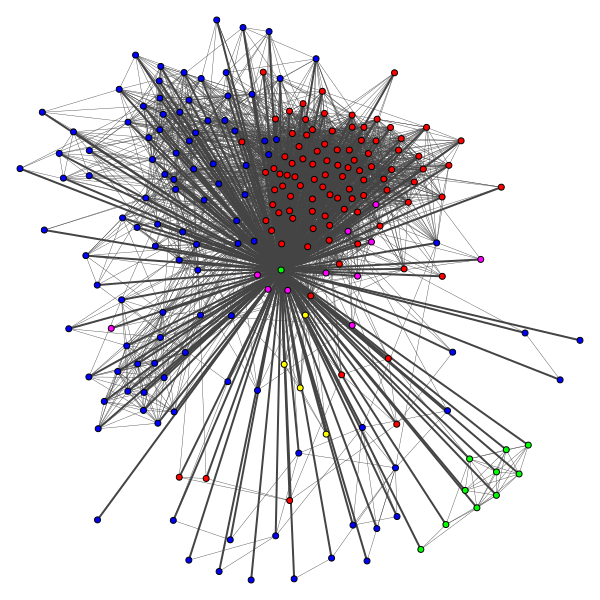

Node 484 Result：
Max Embeddedness Node ID: 482
Max Dispersion Node ID: 482


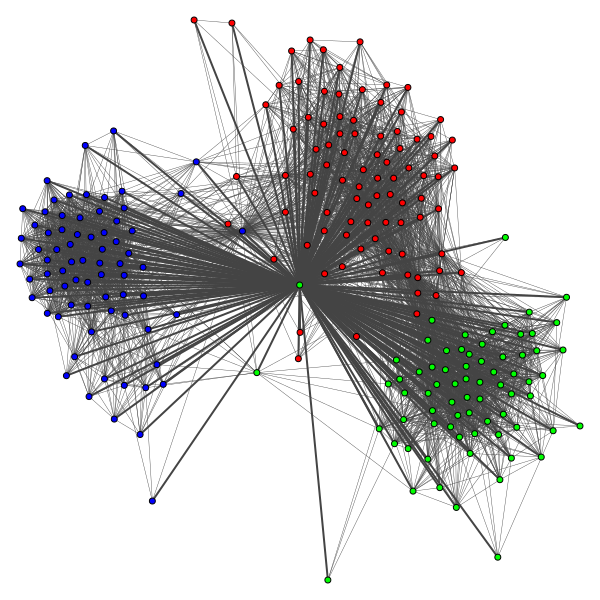

Node 1087 Result：
Max Embeddedness Node ID: 1083
Max Dispersion Node ID: 1083


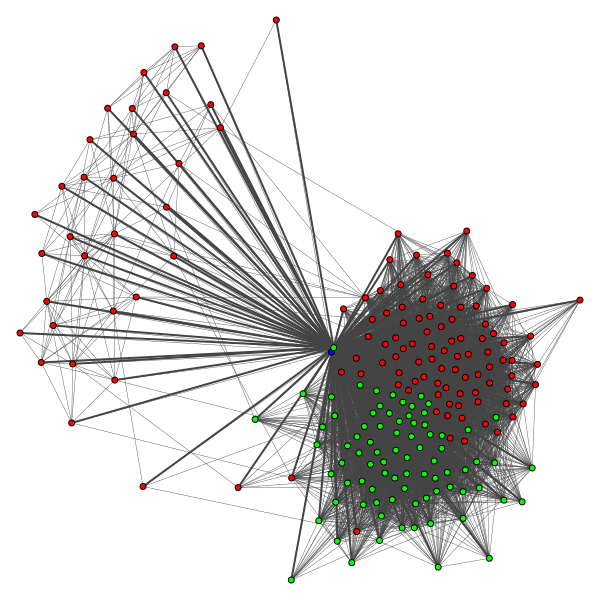

In [ ]:

target_ids = [0, 107, 348, 483, 1086]

for node_id in target_ids:

    ego = g.induced_subgraph(g.neighborhood(node_id))
    new_core_id = g.neighborhood(node_id).index(node_id)
    neighbors = set(ego.neighbors(new_core_id))

    embeddedness = []
    dispersion = []
    neighbors_list = []

    for u in neighbors:
        # mutual friends
        mutual = set(ego.neighbors(new_core_id)) & set(ego.neighbors(u))
        emb = len(mutual)

        # exclude the nodes having zero embeddedness
        if emb == 0:
            continue
        embeddedness.append(emb)
        neighbors_list.append(u)

        if len(mutual) < 2:
            dispersion.append(0)
            continue

        # create new subgraph and remove core node and node u
        temp = ego.copy()
        temp.delete_vertices([new_core_id, u])

        # Calculate the shortest path for every pair of the mutual friends
        mutual_list = list(mutual)
        dist_sum = 0
        for i in range(len(mutual_list)):
            for j in range(i+1, len(mutual_list)):
                try:
                    d = temp.shortest_paths(mutual_list[i], mutual_list[j])[0][0]
                    if d != float("inf"):
                        dist_sum += d
                except:
                    continue
        dispersion.append(dist_sum)


    if embeddedness:
        max_embeddedness_node = neighbors_list[np.argmax(embeddedness)]
    else:
        max_embeddedness_node = None

    if dispersion:
        max_dispersion_node = neighbors_list[np.argmax(dispersion)]
    else:
        max_dispersion_node = None

    # Fast-Greedy
    communities = ego.community_fastgreedy().as_clustering()
    colors = ig.drawing.colors.ClusterColoringPalette(len(communities)).get_many(communities.membership)


    ego.vs["color"] = colors
    ego.vs[new_core_id]["color"] = "blue"
    if max_embeddedness_node is not None:
        ego.vs[max_embeddedness_node]["color"] = "red"
    if max_dispersion_node is not None:
        ego.vs[max_dispersion_node]["color"] = "green"


    ego.es["width"] = [0.4] * ego.ecount()
    if max_embeddedness_node is not None:
        for e in ego.incident(max_embeddedness_node, mode="all"):
            ego.es[e]["width"] = 2
    if max_dispersion_node is not None:
        for e in ego.incident(max_dispersion_node, mode="all"):
            ego.es[e]["width"] = 2




    layout = ego.layout("fr")
    visual_style = {
        "layout": layout,
        "bbox": (600, 600),
        "margin": 20,
        "vertex_size": 6
    }

    print(f"Node {node_id+1} Result：")
    if max_embeddedness_node is not None:
        print(f"Max Embeddedness Node ID: {g.neighborhood(node_id)[max_embeddedness_node]}")
    else:
        print("No node with embeddedness > 0")

    if max_dispersion_node is not None:
        print(f"Max Dispersion Node ID: {g.neighborhood(node_id)[max_dispersion_node]}")
    else:
        print("No node with dispersion > 0")


    plot_path = f"Node{node_id+1}_Q14_MaxNodes.png"
    ig.plot(ego, target=plot_path, **visual_style)
    display(Image.open(plot_path))
    os.remove(plot_path)




#### Question 14: Repeat Question 13, but now highlight the node with maximum embeddedness and the node with maximum dispersion/embeddedness (excluding the nodes having zero embeddedness if there are any). Also, highlight the edges incident to these nodes. Report the id of those nodes.

In this question, we not only highlight the most embedded and dispersed neighbors but also highlight their incident edges. This allowed us to observe how these key nodes interact with the rest of the network in terms of connectivity.

The results are shown below:

Node 1:
*   Max Embeddedness Node: 56
*   Max Dispersion Node: 67

Node 108:
*   Max Embeddedness Node (Global ID): 0
*   Max Dispersion Node (Global ID): 58

Node 349:
*   Max Embeddedness Node (Global ID): 198
*   Max Dispersion Node (Global ID): 198

Node 484:
*   Max Embeddedness Node (Global ID): 482
*   Max Dispersion Node (Global ID): 482

Node 1087:
*   Max Embeddedness Node: 1083
*   Max Dispersion Node: 1083








## Question 15

#### Question 15: Use the plots from Question 13 and 14 to explain the characteristics of a node revealed by each of this measure.

By analyzing the visualizations from Questions 13 and 14, we can observe that:

Embeddedness (Red)
- Nodes with high embeddedness are tightly connected to the core node’s neighborhood.
- These nodes tend to lie within the same community as the core node.
- These nodes have strong connections with the core and also with each other. They often belong to the same friend circle.
- In the plots, these nodes are typically located close to the core node and belong to the same color region, which means the same community.

> For example, in Node 1087’s personalized network, the max embeddedness node lies in the same cluster as the core node and has multiple overlapping edges to its neighbors.

Dispersion (Green)
- Nodes with high dispersion may share fewer common friends with the core node.
- Since the mutual friends are not strongly connected, these nodes are often seen as the bridges between otherwise disconnected parts of the network.
- In the plots, these nodes are often further from the core node, and their connections spread across multiple regions.

> For example, in Node 484, the max dispersion node connects to various regions, and its mutual friends are distributed across different parts of the graph

In conclusion, embeddedness shows how closely a node is connected to the core and its friends and dispersion shows a node's potential to connect different parts of the network.


## Question 16

#### Having defined the friend recommendation procedure, we can now apply it to the personalized network of node ID 415. Before we apply the algorithm, we need to create the list of users who we want to recommend new friends to. We create this list by picking all nodes with degree 24. We will denote this list as Nr.

In [ ]:
# create the personalized network of node 415
ego_415 = g.induced_subgraph(g.neighborhood(414))

# Find the nodes with degree 24
Nr = [v.index for v in ego_415.vs if ego_415.degree(v) == 24]
print(f"|Nr| = {len(Nr)}")


|Nr| = 11


#### Question 16: What is |Nr|, i.e. the length of the list Nr?

|Nr| is the set of nodes in core node 415’s personalized network that have a degree of exactly 24.

The length of |Nr| is 11, which means that there are 11 nodes whose degree is exactly 24.

## Question 17

In [ ]:
import random

def common_neighbors(g, u, v):
    return len(set(g.neighbors(u)) & set(g.neighbors(v)))

def jaccard(g, u, v):
    a, b = set(g.neighbors(u)), set(g.neighbors(v))
    return len(a & b) / len(a | b) if a | b else 0

def adamic_adar(g, u, v):
    common = set(g.neighbors(u)) & set(g.neighbors(v))
    return sum(1 / g.degree(n) for n in common if g.degree(n) > 0)


def evaluate(g, node, method_fn):
    neighbors = set(g.neighbors(node))
    # If the number of friends is less than 4, we cannot remove node with 25%
    if len(neighbors) < 4:
        return None

    accuracies = []
    for _ in range(10):
        Ri = set(random.sample(list(neighbors), int(len(neighbors) * 0.25)))
        N = len(Ri)
        removed_node_graph = g.copy()
        removed_node_graph.delete_edges([(node, r) for r in Ri])

        # recommended_friend is all nodes except for the removed nodes and itself
        recommended_friend = set(range(g.vcount())) - set(removed_node_graph.neighbors(node)) - {node}
        scores = []
        for r in recommended_friend:
            score = method_fn(removed_node_graph, node, r)
            scores.append((r, score))

        scores.sort(key=lambda x: x[1], reverse=True)
        Pi = {r for r, _ in scores[:N]}
        acc = len(Ri & Pi) / len(Ri)
        accuracies.append(acc)

    return sum(accuracies) / len(accuracies)


#### Common Neighbors measure

In [ ]:
count = 0
total = 0

for n in Nr:
    acc = evaluate(ego_415, n, common_neighbors)
    if acc is not None:
        total += acc
        count += 1

if count > 0:
    avg_acc = total / count
else:
    avg_acc = 0

print(f"Common Neighbors Average Accuracy: {avg_acc:.4f}")

Common Neighbors Average Accuracy: 0.8424


#### Jaccard

In [ ]:
count = 0
total = 0

for n in Nr:
    acc = evaluate(ego_415, n, jaccard)
    if acc is not None:
        total += acc
        count += 1

if count > 0:
    avg_acc = total / count
else:
    avg_acc = 0

print(f"Jaccard Average Accuracy: {avg_acc:.4f}")

Jaccard Average Accuracy: 0.8182


#### Adamic Adar measure

In [ ]:
count = 0
total = 0

for n in Nr:
    acc = evaluate(ego_415, n, adamic_adar)
    if acc is not None:
        total += acc
        count += 1

if count > 0:
    avg_acc = total / count
else:
    avg_acc = 0

print(f"Adamic Adar Average Accuracy: {avg_acc:.4f}")

Adamic Adar Average Accuracy: 0.8258


#### Question 17: Based on the average accuracy values, which friend recommendation algorithm is the best?

Based on the result that we evaluated through three methods.

Common Neighbors: 0.8424, Jaccard : 0.8182, Adamic Adar : 0.8258.

Common Neighbors has the highest accuracy which indicates that counting the number of mutual friends is a highly effective predictor in this personalized network. This is likely because many users in the ego network of node 415 share a dense set of mutual friends, and direct overlap is a strong signal of potential friendship.




# 2. Google+ network

## Question 18
How many personal networks are there?

In [ ]:
ids = set()
for file_name in os.listdir('data/gplus/gplus'):
    id = file_name.split('.')[0]
    ids.add(id)
print(f'There are {len(ids)} personal networks in the dataset.')

There are 132 personal networks in the dataset.


## Question 19
For the 3 personal networks (node ID given below), plot the in-degree and out degree distribution of these personal networks. Do the personal networks have a similar in and out degree distribution? In this question, you should have 6 plots.
- 109327480479767108490
- 115625564993990145546
- 101373961279443806744

In [ ]:
id_to_analysis = ['109327480479767108490', '115625564993990145546', '101373961279443806744']

graphs = []
# Load the graph
for id in id_to_analysis:
    print(f'Loading graph for {id}...')
    path = os.path.join('data/gplus/gplus', f'{id}.edges')
    # Load the graph from the edgelist file
    g = nx.read_edgelist(path, create_using=nx.DiGraph)
    graphs.append(g)


Loading graph for 109327480479767108490...
Loading graph for 115625564993990145546...
Loading graph for 101373961279443806744...


In [ ]:
subplot_titles = ['In-Degree Distribution', 'Out-Degree Distribution']
subplot_titles = [id+' '+title for title in subplot_titles for id in id_to_analysis  ]
fig = make_subplots(rows=2, cols=3, subplot_titles=subplot_titles)

# Analyze the in-degree/out-degree distribution
for i, (id, g) in enumerate(zip(id_to_analysis, graphs)):
    in_degree_sequence = sorted([d for n, d in g.in_degree()], reverse=True)
    out_degree_sequence = sorted([d for n, d in g.out_degree()], reverse=True)
    fig.add_trace(go.Histogram(x=in_degree_sequence, histnorm='probability density', name=f'{id} In-Degree'), row=1, col=i+1)
    fig.update_xaxes(title_text='In-Degree', row=1, col=i+1)
    fig.update_yaxes(title_text='Probability Density', row=1, col=i+1)
    
    fig.add_trace(go.Histogram(x=out_degree_sequence, histnorm='probability density', name=f'{id} Out-Degree'), row=2, col=i+1)
    fig.update_xaxes(title_text='Out-Degree', row=2, col=i+1)
    fig.update_yaxes(title_text='Probability Density', row=2, col=i+1)

fig.update_layout(title_text='In-Degree and Out-Degree Distribution', height=800, width=2000)
#fig.update_layout(hovermode='x unified')
fig.show()

![In-Degree and Out-Degree Distribution.png](<attachment:In-Degree and Out-Degree Distribution.png>)
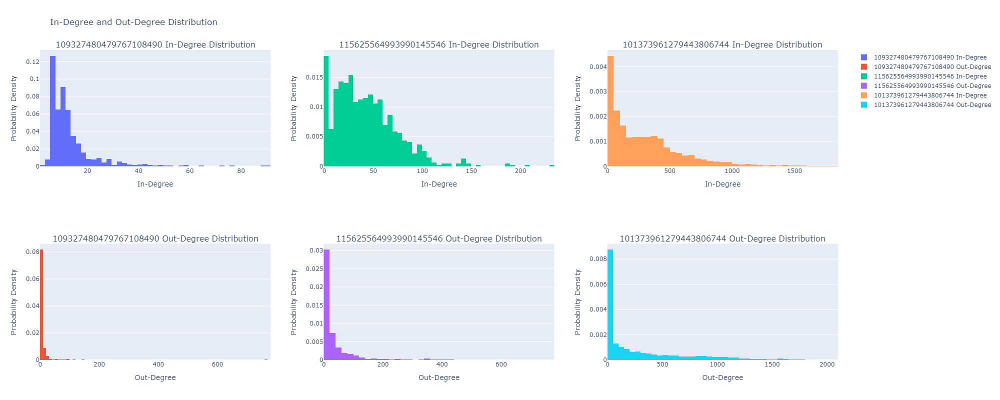

From the in/out-degree distribution plots above, we can observe that all three personal networks exhibit a similarly left-skewed distribution. However, the actual degree values differ significantly across the networks. The average in-degree increases noticeably, from around 20 in the first network to nearly 500 in the third. A similar trend is observed in the out-degree distributions, where the average also rises substantially across the three networks.

## Question 20
For the 3 personal networks picked in Question 19, extract the community structure of each personal network using Walktrap community detection algorithm. Report the modularity scores and plot the communities using colors. Are the modularity scores similar? In this question, you should have 3 plots.

In [ ]:
import plotly.graph_objects as go
import networkx as nx
import numpy as np

def visualize_communities_plotly(g, communities, title="Community Visualization"):
    # Map each node to its community
    node_color_map = {}
    for i, comm in enumerate(communities):
        for node in comm:
            node_color_map[node] = i

    # Generate layout (node positions)
    pos = nx.spring_layout(g, seed=42, k=1/np.sqrt(len(g)))  # Adjust k value for better spacing in large graphs

    # Extract node positions and corresponding community information
    node_x, node_y, node_color, node_text = [], [], [], []
    for node in g.nodes():
        x, y = pos[node]
        node_x.append(x)
        node_y.append(y)
        node_color.append(node_color_map.get(node, 0))  # Default to 0 if node is not in any community
        node_text.append(f"Node {node}<br>Community {node_color_map.get(node, '?')}")  # Tooltip text

    # Extract edge coordinates
    edge_x, edge_y = [], []
    for u, v in g.edges():
        x0, y0 = pos[u]
        x1, y1 = pos[v]
        edge_x.extend([x0, x1, None])  # Add None to separate edges
        edge_y.extend([y0, y1, None])

    # Create edge trace
    edge_trace = go.Scatter(
        x=edge_x, y=edge_y,
        line=dict(width=0.3, color='#888'),  # Thin gray lines for edges
        hoverinfo='none',
        mode='lines'
    )

    # Create node trace
    node_trace = go.Scatter(
        x=node_x, y=node_y,
        mode='markers',
        marker=dict(
            showscale=True,  # Show color scale
            colorscale='Viridis',  # Color scale for communities
            color=node_color,  # Node colors based on community
            size=5,  # Node size
            colorbar=dict(
                thickness=10,
                title='Community',  # Colorbar title
                xanchor='left',
                titleside='right'
            ),
            line_width=0  # No border around nodes
        ),
        text=node_text,  # Tooltip text
        hoverinfo='text'
    )

    # Create the figure
    fig = go.Figure(data=[edge_trace, node_trace],
                    layout=go.Layout(
                        title=title,  # Plot title
                        titlefont_size=16,
                        showlegend=False,  # Disable legend
                        hovermode='closest',  # Enable hover interaction
                        margin=dict(b=20, l=5, r=5, t=40),  # Margins
                        xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),  # Hide x-axis
                        yaxis=dict(showgrid=False, zeroline=False, showticklabels=False)   # Hide y-axis
                    ))

    # Save the plot as an image
    fig.write_image(f"community_visualization_{title}.png", width=1200, height=1000)


In [ ]:
def visualize_communities(g, communities, title):
    node_color = {id:0 for id in g.nodes()}
    for i, comm in enumerate(communities):
        for node in comm:
            node_color[node] = i 

    pos = nx.spring_layout(g, seed=42) 
    plt.figure(figsize=(8, 6))
    nx.draw(g, pos=pos, node_color=[node_color[id] for id in g.nodes()], node_size=10, edge_color='gray', width=0.5, cmap='tab20', with_labels=False)

    plt.title(title)
    plt.axis("off")
    plt.show()
    
    
    
def Walktrap(g, id):
    print(f'Running Walktrap for {id}...')
    walktrap_result = algorithms.walktrap(g)
    communities = walktrap_result.communities
    print('Modulity:', nx.algorithms.community.quality.modularity(g, communities))
    visualize_communities_plotly(g, communities, f'Walktrap Communities for {id}')

In [ ]:
Walktrap(graphs[0], id_to_analysis[0])


Running Walktrap for 109327480479767108490...
Modulity: 0.29623483751288393


![community_visualization_Walktrap Communities for 109327480479767108490.png](<attachment:community_visualization_Walktrap Communities for 109327480479767108490.png>)
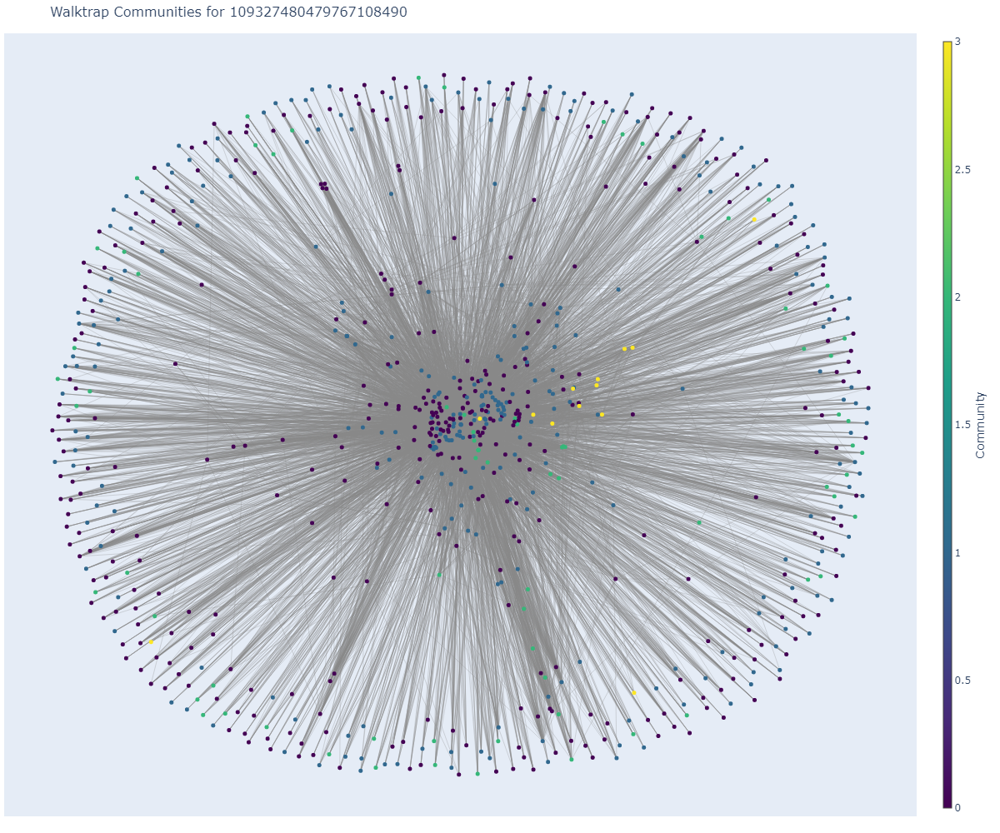

In [ ]:
Walktrap(graphs[1], id_to_analysis[1])

Running Walktrap for 115625564993990145546...
Modulity: 0.3235108125692494


![community_visualization_Walktrap Communities for 115625564993990145546.png](<attachment:community_visualization_Walktrap Communities for 115625564993990145546.png>)
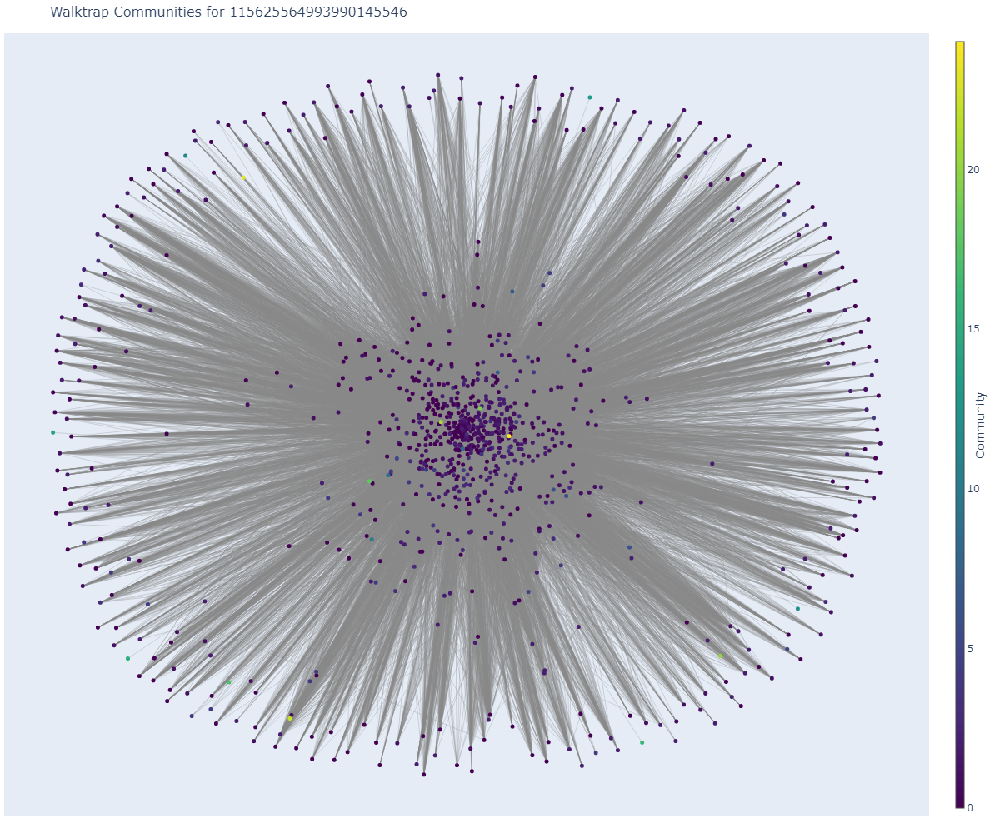

In [ ]:
Walktrap(graphs[2], id_to_analysis[2])

Running Walktrap for 101373961279443806744...
Modulity: 0.1951371387685598


![community_visualization_Walktrap Communities for 101373961279443806744.png](<attachment:community_visualization_Walktrap Communities for 101373961279443806744.png>)
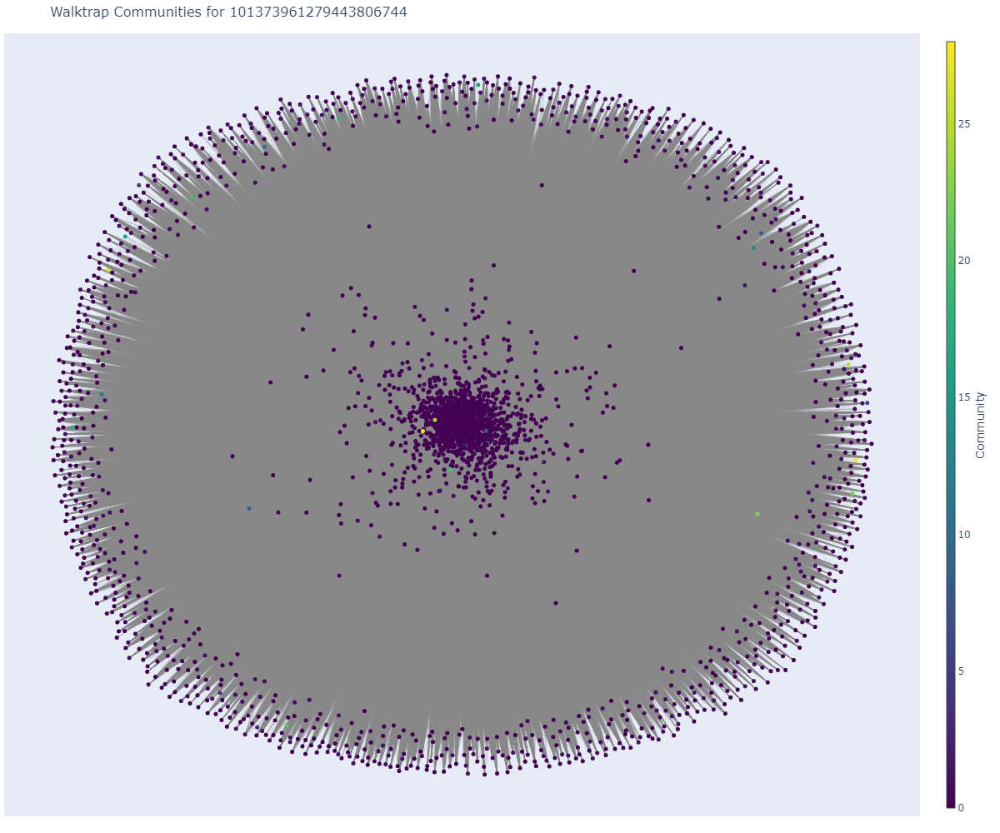

## Question 21: 
Based on the expression for h and c, explain the meaning of homogeneity and completeness in words.

**Homogeneity** measures whether the members of a community come from the same circle.  
If all members in a community are from a single circle, then the conditional entropy $ H(C|K) $ will be 0, and thus the homogeneity will be 1.  
On the other hand, if members in a community come from multiple circles, $ H(C|K) $ will increase, resulting in a lower homogeneity score.

**Completeness** measures whether all members of a circle are grouped into the same community.  
If everyone in a circle is correctly classified into a single community, then $ H(K|C) $ will be 0 and completeness will be 1.  
Otherwise, if members of a circle are scattered across different communities, $ H(K|C) $ will increase, reducing the completeness.


## Question 22: 
Compute the h and c values for the community structures of the 3 personal network (same nodes as Question 19). Interpret the values and provide a detailed explanation. Are there negative values? Why?

In [ ]:
def homogeneity(g, circles, communities):
    """
    Calculate the homogeneity of the communities.
    """
    people_with_circle_info = set([p for c in circles for p in c ])
    N = len(people_with_circle_info)
    circle_entropy = -sum([len(c)/N*log(len(c)/N) for c in circles])
    conditional_entropy = 0
    for k in communities:
        b = len(set(k)&set(people_with_circle_info))
        for c in circles:
            A_ji = set(k) & set(c)
            if len(A_ji) == 0:
                continue
            conditional_entropy -= len(A_ji)/N * log(len(A_ji)/b)
    return 1 - conditional_entropy/circle_entropy

def completeness(g, circles, communities):
    """
    Calculate the completeness of the communities.
    """
    people_with_circle_info = set([p for c in circles for p in c ])
    N = len(people_with_circle_info)
    community_entropy = 0
    for k in communities:
        b = len(set(k) & people_with_circle_info)
        if b == 0:
            continue
        community_entropy -= b/N * log(b/N)
    
    conditional_entropy = 0
    for c in circles:
        a = len(c)
        for k in communities:
            A_ji = set(k) & set(c)
            if len(A_ji) == 0 or a == 0 :
                continue
            conditional_entropy -= len(A_ji)/N * log(len(A_ji)/a)
    #print(f'Community Entropy: {community_entropy}, Conditional Entropy: {conditional_entropy}')
    return 1 - conditional_entropy/community_entropy
    

In [ ]:
id_to_analysis = ['109327480479767108490', '115625564993990145546', '101373961279443806744']

circles = {}
# Load the graph
for id in id_to_analysis:
    print(f'Loading circles for {id}...')
    path = os.path.join('data/gplus/gplus', f'{id}.circles')
    circles[id] = []
    with open(path, 'r') as f:
        for line in f:
            circle = line.strip().split()[1:]
            circles[id].append(set(circle))

Loading circles for 109327480479767108490...
Loading circles for 115625564993990145546...
Loading circles for 101373961279443806744...


In [ ]:
communities = [algorithms.walktrap(g).communities for g in graphs]

In [ ]:
df = pd.DataFrame(columns=['id', 'homogeneity', 'completeness'])
df['id'] = id_to_analysis
df['homogeneity'] = [homogeneity(g, circles[id], c) for id, g, c in zip(id_to_analysis, graphs, communities)]
df['completeness'] = [completeness(g, circles[id], c) for id, g, c in zip(id_to_analysis, graphs, communities)]
df

,id,homogeneity,completeness
0,109327480479767108490,0.864004,0.345692
1,115625564993990145546,0.442945,-3.375718
2,101373961279443806744,0.001839,-1.609263


**Interpretation:**

- The first network has high homogeneity, meaning that each community mostly contains nodes from the same circle. Its completeness is moderate, suggesting that not all members of each circle are grouped together in the same community.
- The second network shows a moderate level of both homogeneity and completeness, indicating a partial alignment between circles and communities.
- The last network has extremely low values for both measures. This suggests that the detected communities are almost entirely unaligned with the circle structure—nodes from the same circle are scattered across different communities, and communities consist of nodes from multiple circles.

**Explanation of Negative Values:**

In our custom implementation, we observed that some **completeness values were negative**. This occurred because a node may appear in **multiple circles** in the dataset (i.e., multi-label ground truth), and our implementation counts each node **multiple times** during the calculation of conditional entropy. This can artificially inflate the conditional entropy, making it **larger than the community entropy**, which leads to a negative completeness value.

This result is **theoretically incorrect**, since completeness is defined as:

$$
c = 1 - \frac{H(K|C)}{H(K)}
$$

and should always lie between 0 and 1.

To resolve this issue, we need to avoid counting a node more than once. One way is to switch from raw counts to **proper probability-based entropy**, which ensures that the relationship between entropy and conditional entropy remains valid and bounded.


# 3. Cora dataset

## Question 23: Idea 1
Use GraphConvolutional Networks [1]. What hyperparameters do you choose to get the optimal performance? How many layers did you choose?

#### Hyperparameter Setting

Hyperparameter | Value
--- | ---
Hidden units | 16
Optimizer | Adam
Learning rate | 0.01
Weight decay | 5e-4
Epochs | 200
Dropout | Not used
Activation function | ReLU
Loss function | Cross-entropy
Device | GPU if available, else CPU

#### Model Arcgitecture

We apply simple 2-layer GCN network with 16 hidden dim.
- Layer 1: `GCNConv(input_dim=1433, hidden_dim=16)`
    - Activation: ReLU
- Layer 2: `GCNConv(hidden_dim=16, output_dim=7)`
    - Output: raw logits (no softmax during training; used for F.cross_entropy)

#### Final Result
We achieved 1.0 accuracy on train set and 0.8 on test set.

In [ ]:
from torch_geometric.datasets import Planetoid
import torch
import torch.nn.functional as F
from torch_geometric.nn import GCNConv, Node2Vec

c:\Users\USER\OneDrive\文件\academic\ucla\spring25\ECE232\project\.venv\lib\site-packages\torch_geometric\typing.py:68: UserWarning: An issue occurred while importing 'pyg-lib'. Disabling its usage. Stacktrace: [WinError 127] 找不到指定的程序。
  warnings.warn(f"An issue occurred while importing 'pyg-lib'. "
c:\Users\USER\OneDrive\文件\academic\ucla\spring25\ECE232\project\.venv\lib\site-packages\torch_geometric\typing.py:86: UserWarning: An issue occurred while importing 'torch-scatter'. Disabling its usage. Stacktrace: [WinError 127] 找不到指定的程序。
  warnings.warn(f"An issue occurred while importing 'torch-scatter'. "
c:\Users\USER\OneDrive\文件\academic\ucla\spring25\ECE232\project\.venv\lib\site-packages\torch_geometric\typing.py:113: UserWarning: An issue occurred while importing 'torch-spline-conv'. Disabling its usage. Stacktrace: [WinError 127] 找不到指定的程序。
  warnings.warn(
c:\Users\USER\OneDrive\文件\academic\ucla\spring25\ECE232\project\.venv\lib\site-packages\torch_geometric\typing.py:124: UserWarni

In [ ]:
Cora_dataset = Planetoid(root='data\cora', name='Cora')
Cora_dataset[0]

Data(x=[2708, 1433], edge_index=[2, 10556], y=[2708], train_mask=[2708], val_mask=[2708], test_mask=[2708])

In [ ]:
class GCN(torch.nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels):
        super(GCN, self).__init__()
        self.conv1 = GCNConv(in_channels, hidden_channels)
        self.conv2 = GCNConv(hidden_channels, out_channels)

    def forward(self, x, edge_index):
        x = self.conv1(x, edge_index)
        x = F.relu(x)
        x = self.conv2(x, edge_index)
        return x

In [ ]:
def train_gcn(model, graph, optimizer):
    model.train()
    optimizer.zero_grad()
    out = model(graph.x, graph.edge_index)
    loss = F.cross_entropy(out[graph.train_mask], graph.y[graph.train_mask])
    loss.backward()
    optimizer.step()

    return loss.item()

def test_gcn(model, data):
    model.eval()
    logits = model(data.x, data.edge_index)
    masks = ['train_mask', 'val_mask', 'test_mask']
    accs = []
    for mask in masks:
        pred = logits[getattr(data, mask)].argmax(dim=1)
        acc = (pred == data.y[getattr(data, mask)]).sum() / getattr(data, mask).sum()
        accs.append(acc.item())
    return accs

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'Using device: {device}')

cora_graph = Cora_dataset[0].to(device)
model = GCN(cora_graph.num_features, 16, Cora_dataset.num_classes).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=0.01, weight_decay=5e-4)

epochs = 200

Using device: cuda


In [ ]:
acc_df = pd.DataFrame(columns=['epoch', 'train_acc', 'val_acc', 'test_acc'])
for epoch in range(1, epochs+1):
    loss = train_gcn(model, cora_graph, optimizer)
    train_acc, val_acc, test_acc = test_gcn(model, cora_graph)
    
    acc_df.loc[epoch-1] = [epoch, train_acc, val_acc, test_acc]
    if epoch % 10 == 0:
        print(f'Epoch {epoch:03d}, Loss: {loss:.4f}, Train Acc: {train_acc:.4f}, Val Acc: {val_acc:.4f}, Test Acc: {test_acc:.4f}') 
    

Epoch 010, Loss: 0.6241, Train Acc: 0.9929, Val Acc: 0.7740, Test Acc: 0.7970
Epoch 020, Loss: 0.1018, Train Acc: 1.0000, Val Acc: 0.7800, Test Acc: 0.8000
Epoch 030, Loss: 0.0256, Train Acc: 1.0000, Val Acc: 0.7780, Test Acc: 0.7810
Epoch 040, Loss: 0.0136, Train Acc: 1.0000, Val Acc: 0.7880, Test Acc: 0.7900
Epoch 050, Loss: 0.0121, Train Acc: 1.0000, Val Acc: 0.7800, Test Acc: 0.7930
Epoch 060, Loss: 0.0136, Train Acc: 1.0000, Val Acc: 0.7800, Test Acc: 0.8010
Epoch 070, Loss: 0.0154, Train Acc: 1.0000, Val Acc: 0.7780, Test Acc: 0.8030
Epoch 080, Loss: 0.0163, Train Acc: 1.0000, Val Acc: 0.7760, Test Acc: 0.8050
Epoch 090, Loss: 0.0161, Train Acc: 1.0000, Val Acc: 0.7740, Test Acc: 0.8020
Epoch 100, Loss: 0.0154, Train Acc: 1.0000, Val Acc: 0.7780, Test Acc: 0.8030
Epoch 110, Loss: 0.0145, Train Acc: 1.0000, Val Acc: 0.7740, Test Acc: 0.8050
Epoch 120, Loss: 0.0138, Train Acc: 1.0000, Val Acc: 0.7740, Test Acc: 0.8070
Epoch 130, Loss: 0.0131, Train Acc: 1.0000, Val Acc: 0.7740, Tes

<Axes: title={'center': 'GCN Training and Validation Accuracy'}, xlabel='epoch'>

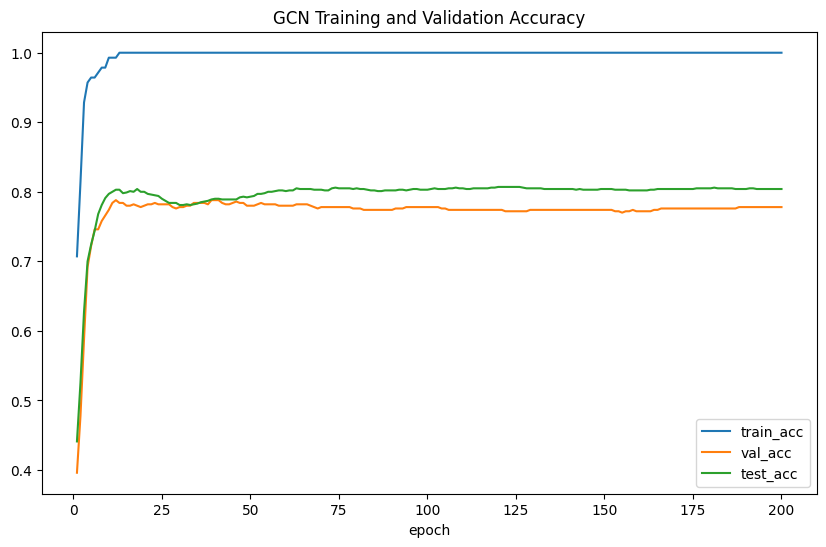

In [ ]:
acc_df.plot(x='epoch', y=['train_acc', 'val_acc', 'test_acc'], figsize=(10, 6), title='GCN Training and Validation Accuracy')

In [ ]:
# Report the final test accuracy
train_acc, val_acc, test_acc = test_gcn(model, cora_graph)
print(f'Final Test Accuracy: {test_acc:.4f}')

Final Test Accuracy: 0.8040


## Question 24: Idea 2
Extract structure-based node features using Node2Vec [2]. Briefly describe how Node2Vec finds node features. Choose your desired classifier (one of SVM, Neural Network, or Random Forest) and classify the documents using only Node2Vec (graph structure) features. Now classify the documents using only the 1433-dimensional text features. Which one outperforms? Why do you think this is the case? Combine the Node2Vec and text features and train your classifier on the combined features. What is the best classification accuracy you get (in terms of the percentage of test documents correctly classified)

#### Train Node2Vec

In [ ]:
embedding_dim = 64


node2vec = Node2Vec(
    edge_index=cora_graph.edge_index,
    embedding_dim=embedding_dim,
    walk_length=20,  # Length of each random walk
    context_size=10,  # Context size for skip-gram
    walks_per_node=10,  # Number of walks per node
    num_negative_samples=1,  # Number of negative samples for training
    p=1.0,  # Return parameter for random walks
    q=1.0,  # In-out parameter for random walks
    sparse=True
).to(device)

loader = node2vec.loader(batch_size=128, shuffle=True)
optimizer = torch.optim.SparseAdam(list(node2vec.parameters()), lr=0.01)

epochs = 25

In [ ]:
def train_node2vec(node2vec, loader, optimizer):
    node2vec.train()
    device = next(node2vec.parameters()).device  # Get the device from the model parameters

    total_loss = 0
    for pos_rw, neg_rw in loader:
        optimizer.zero_grad()
        loss = node2vec.loss(pos_rw.to(device), neg_rw.to(device))
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    return total_loss / len(loader)

In [ ]:
for epoch in range(1, epochs+1):
    loss = train_node2vec(node2vec, loader, optimizer)
    if epoch % 5 == 0:
        print(f'Epoch {epoch:03d}, Loss: {loss:.4f}')

Epoch 005, Loss: 2.1734
Epoch 010, Loss: 1.2213
Epoch 015, Loss: 0.9836
Epoch 020, Loss: 0.9063
Epoch 025, Loss: 0.8743


In [ ]:
embeddings = node2vec.embedding.weight.data.cpu().numpy()
assert embeddings.shape==(cora_graph.num_nodes, embedding_dim), "Embeddings shape mismatch"

#### Train classifiers using Node2Vec features
Train both SVM and RandomForest on Node2Vec features saperately and perform grid search to find their best hyperparameter setting.

In [ ]:
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier

In [ ]:
performances = pd.DataFrame(columns=['feature', 'model', 'parameter', 'test_accuracy'])

In [ ]:
train_X, test_X, train_y, test_y = train_test_split(embeddings, cora_graph.y.cpu().numpy(), test_size=0.7, random_state=42)

In [ ]:
def grid_search_hyperparameters(Estimator, params, train_X, train_y, test_X, test_y):
    clf = GridSearchCV(Estimator(), params, cv=3, verbose=1, n_jobs=-1).fit(train_X, train_y)
    
    best_model = clf.best_estimator_
    test_acc = best_model.score(test_X, test_y)
    print('best parameter:', clf.best_params_, 'average score:', clf.best_score_)
    print(f'Test Accuracy: {test_acc:.4f}')
    
    return best_model, clf.best_params_, test_acc

In [ ]:
svm_params = {
    'C': [0.1, 1.0, 10.0],
    'gamma': ['scale', 'auto'],
    'kernel': ['rbf', 'linear']
}

best_svm_model, best_svm_params, svm_test_acc = grid_search_hyperparameters(SVC, svm_params, train_X, train_y, test_X, test_y)
performances.loc[len(performances)] = ['node2vec', 'SVM', best_svm_params, svm_test_acc]

Fitting 3 folds for each of 12 candidates, totalling 36 fits
best parameter: {'C': 0.1, 'gamma': 'scale', 'kernel': 'linear'} average score: 0.7906837957268462
Test Accuracy: 0.7547


In [ ]:
rf_grid_params = {
    'n_estimators': [50, 100, 200],
    'max_depth': [None, 10, 20],
}

best_rf_model, best_rf_params, rf_test_acc = grid_search_hyperparameters(RandomForestClassifier, rf_grid_params, train_X, train_y, test_X, test_y)
performances.loc[len(performances)] = ['node2vec', 'Random Forest', best_rf_params, rf_test_acc]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
best parameter: {'max_depth': 20, 'n_estimators': 200} average score: 0.780802696915858
Test Accuracy: 0.7648


#### Train the classifier using text features
Train both SVM and RandomForest on text features saperately and perform grid search to find their best hyperparameter setting.

In [ ]:
# Process text features from Cora dataset
text_feature = Cora_dataset[0].x.cpu().numpy()
text_feature.shape, text_feature.dtype

train_text_X, test_text_X, train_text_y, test_text_y = train_test_split(text_feature, cora_graph.y.cpu().numpy(), test_size=0.7, random_state=42)

In [ ]:
# Train SVM on text features
best_svm_model, best_svm_params, text_svm_test_acc = grid_search_hyperparameters(SVC, svm_params, train_text_X, train_text_y, test_text_X, test_text_y)
performances.loc[len(performances)] = ['text', 'SVM', best_svm_params, text_svm_test_acc]

Fitting 3 folds for each of 12 candidates, totalling 36 fits
best parameter: {'C': 0.1, 'gamma': 'scale', 'kernel': 'linear'} average score: 0.6908614641701973
Test Accuracy: 0.7015


In [ ]:
# Train Random Forest on text features
best_rf_model, best_rf_params, text_rf_test_acc = grid_search_hyperparameters(RandomForestClassifier, rf_grid_params, train_text_X, train_text_y, test_text_X, test_text_y)
performances.loc[len(performances)] = ['text', 'Random Forest', best_rf_params, text_rf_test_acc]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
best parameter: {'max_depth': None, 'n_estimators': 200} average score: 0.7167737232927885
Test Accuracy: 0.7131


#### Combine both text features and Node2Vec features

In [ ]:
X = np.concat([embeddings, text_feature], axis=1) 
train_X, test_X, train_y, test_y = train_test_split(X, cora_graph.y.cpu().numpy(), test_size=0.7, random_state=42)

(2708, 1497)

In [ ]:
# Train SVM on combined features
best_svm_model, best_svm_params, combined_svm_test_acc = grid_search_hyperparameters(SVC, svm_params, train_X, train_y, test_X, test_y)
performances.loc[len(performances)] = ['combined', 'SVM', best_svm_params, combined_svm_test_acc]

Fitting 3 folds for each of 12 candidates, totalling 36 fits
best parameter: {'C': 0.1, 'gamma': 'scale', 'kernel': 'linear'} average score: 0.7906837957268462
Test Accuracy: 0.7547


In [ ]:
# Train Random Forest on combined features
best_rf_model, best_rf_params, combined_rf_test_acc = grid_search_hyperparameters(RandomForestClassifier, rf_grid_params, train_X, train_y, test_X, test_y)
performances.loc[len(performances)] = ['combined', 'Random Forest', best_rf_params, combined_rf_test_acc]

Fitting 3 folds for each of 9 candidates, totalling 27 fits
best parameter: {'max_depth': 10, 'n_estimators': 100} average score: 0.775850758507585
Test Accuracy: 0.7664


In [ ]:
performances.sort_values(by='feature', ascending=False, inplace=True)
performances

,feature,model,parameter,test_accuracy
3,text,Random Forest,"{'max_depth': None, 'n_estimators': 200}",0.713080
2,text,SVM,"{'C': 0.1, 'gamma': 'scale', 'kernel': 'linear'}",0.701477
1,node2vec,Random Forest,"{'max_depth': 20, 'n_estimators': 200}",0.764768
0,node2vec,SVM,"{'C': 0.1, 'gamma': 'scale', 'kernel': 'linear'}",0.754747
4,combined,Random Forest,"{'max_depth': 10, 'n_estimators': 100}",0.766350
5,combined,SVM,"{'C': 0.1, 'gamma': 'scale', 'kernel': 'linear'}",0.754747


In [ ]:
from plotly import express as px
px.bar(performances, x='feature', y='test_accuracy', color='model', barmode='group',
        title='Model Performance on Different Features', height=600, width=800).show()

![Model Performance on Different Features.png](<attachment:Model Performance on Different Features.png>)
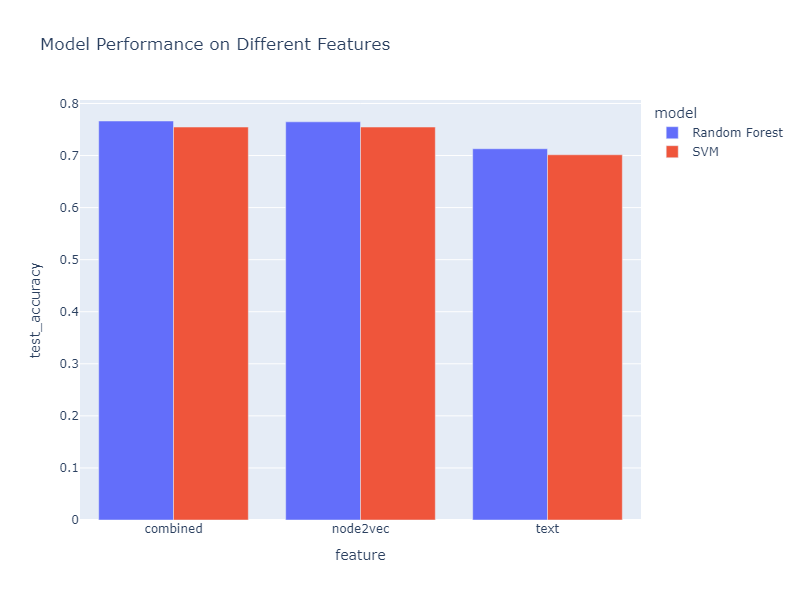

#### Report

##### Node2Vec Feature Extraction
Node2Vec is a structure-based feature learning method that captures the topological roles of nodes in a graph. It works by simulating biased random walks over the graph, generating sequences of nodes that resemble sentences in natural language. These sequences are then used to train a Skip-Gram model (like Word2Vec), which learns low-dimensional embeddings for each node such that nearby nodes in the walk sequences have similar embeddings.

#### Classification Results

| Feature   | Model          | Parameter                                         | Test Accuracy |
|-----------|----------------|--------------------------------------------------|---------------|
| text      | Random Forest  | {'max_depth': None, 'n_estimators': 200}         | 0.713080      |
| node2vec  | Random Forest  | {'max_depth': 20, 'n_estimators': 200}           | 0.764768      |
| combined  | Random Forest  | {'max_depth': 10, 'n_estimators': 100}           | 0.766350      |

From the table above, we can observe Random Forest outperform SVM on three features. 
Node2Vec outperfromed text-only feature in this task, suggesting that graph structure is more informative than bag-of-words text features.
The highest test accuracy was achieved by combining both Node2Vec and text features, reaching 76.6%. This indicates that the structure-based and content-based features are complementary. While Node2Vec captures global graph topology, text features encode topic-specific content. Their combination provides a more complete representation of each document.

### Question 25: Idea 3

In [ ]:
# Get GCC
G = nx.DiGraph()
G.add_edges_from(cora_graph.edge_index.cpu().numpy().T)
print(G.number_of_nodes(), G.number_of_edges())

GCC = max(nx.weakly_connected_components(G), key=len)

GCC_subgraph = G.subgraph(GCC)
print(f'GCC has {len(GCC)} nodes and {GCC_subgraph.number_of_edges()} edges.')

2708 10556
GCC has 2485 nodes and 10138 edges.


In [ ]:
def get_seed_docs(G, num_seeds=20):
    seed_docs = {}
    nodes = list(G.nodes())
    nodes_y = cora_graph.y[nodes].cpu().numpy()
    
    for class_id in range(Cora_dataset.num_classes):
        is_class = (nodes_y == class_id)
        if is_class.sum() == 0:
            print(f'No nodes found for class {class_id}. Skipping.')
            continue

        seed_docs[class_id] = np.random.choice([nodes[n]  for n in range(len(is_class)) if is_class[n]], size=num_seeds)
        
    return seed_docs

def random_walk(G, seed_docs, teleport_prob, num_steps=1000):
    """
    Perform a random walk on the graph G starting from start_node for num_steps.
    Returns the sequence of visited nodes.
    """
    def teleport():
        return np.random.choice(seed_docs)

    def transit(node):
        neighbors = list(G.neighbors(node))
        if not neighbors:
            return node
        transition_probs = transition_probabilities(node, neighbors)
        return np.random.choice(neighbors, p=transition_probs)

    def transition_probabilities(cur_node, neighbors):
        if not neighbors:
            return {}
        x = cora_graph.x
        cosine_similarity = torch.matmul(x[cur_node], x[neighbors].T) 
        return torch.softmax(torch.tensor(cosine_similarity), dim=0).cpu().numpy()
    
    route = []
    current_node = teleport() # Start from a random seed document
    for _ in range(num_steps):
        route.append(current_node)
        if np.random.rand() < teleport_prob:
            current_node = teleport()
        else:
            current_node = transit(current_node)
            
    return route
    

def PageRank(seed_docs, G, teleport_prob=0.15, max_iter=1000):
    # Perform PageRank-like random walk on the graph G starting from seed_docs.
    
    # Initialize class count for each node
    class_cnt = {i: [0]*Cora_dataset.num_classes for i in list(G.nodes())}
    
    # For each class, perform random walk from seed documents
    for class_id in range(Cora_dataset.num_classes):
        route = random_walk(G, seed_docs[class_id], teleport_prob=teleport_prob, num_steps=max_iter)
        for node in route:
            class_cnt[node][class_id] += 1
    
    # Return the class with the highest count for each node
    return {i: np.argmax(class_cnt[i]) for i in list(G.nodes())}

In [ ]:
y = cora_graph.y.cpu().numpy()[GCC_subgraph.nodes()]
seed_docs = get_seed_docs(GCC_subgraph, num_seeds=20)

In [ ]:
for teleport_prob in [0, 0.1, 0.2]:
    print(f'Teleport Probability: {teleport_prob}')
    prediciton = PageRank(seed_docs, GCC_subgraph, teleport_prob=teleport_prob, max_iter=1000)
    predicition_values = np.array([prediciton[i] for i in GCC_subgraph.nodes()])
    print(f'Accuracy: {accuracy_score(y, predicition_values)}')
    print(f'F1 Score: {f1_score(y, predicition_values, average="weighted")}\n')


Teleport Probability: 0
Accuracy: 0.1448692152917505
F1 Score: 0.06652227751336967

Teleport Probability: 0.1
Accuracy: 0.3404426559356137
F1 Score: 0.3600042686675156

Teleport Probability: 0.2
Accuracy: 0.3517102615694165
F1 Score: 0.3732920169808488



We observe that a teleport probability of 0.2 yields the best classification accuracy (35.17%) and macro-F1 score (0.373).
When teleport probability is 0, the classification fails almost completely, indicating that purely structural random walks do not provide enough class-discriminative information.
Introducing teleportation allows the model to continuously reinforce class-specific signals from seed documents, leading to more meaningful ranking of unlabeled nodes.